In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime 

In [2]:
df = pd.read_csv('final_df.csv')


In [3]:
df.columns


Index(['Unnamed: 0', 'DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [4]:
df = df[['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']]

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108070 entries, 0 to 108069
Data columns (total 26 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   DATETIME                    108070 non-null  object 
 1   ND                          108070 non-null  int64  
 2   TSD                         108070 non-null  int64  
 3   ENGLAND_WALES_DEMAND        108070 non-null  int64  
 4   EMBEDDED_WIND_GENERATION    108070 non-null  int64  
 5   EMBEDDED_WIND_CAPACITY      108070 non-null  int64  
 6   EMBEDDED_SOLAR_GENERATION   108070 non-null  int64  
 7   EMBEDDED_SOLAR_CAPACITY     108070 non-null  int64  
 8   PUMP_STORAGE_PUMPING        108070 non-null  int64  
 9   GAS                         108070 non-null  float64
 10  COAL                        108070 non-null  float64
 11  NUCLEAR                     108070 non-null  float64
 12  WIND                        108070 non-null  float64
 13  HYDRO         

In [6]:
df['DATETIME'] = pd.to_datetime(df['DATETIME'])


In [7]:
df.shape

(108070, 26)

In [8]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

# EDA

In [9]:
columns = ['DATETIME', 'TSD',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION',
       'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']

In [10]:
df[columns].describe()

,TSD,EMBEDDED_WIND_GENERATION,EMBEDDED_WIND_CAPACITY,EMBEDDED_SOLAR_GENERATION,GAS,COAL,NUCLEAR,WIND,HYDRO,IMPORTS,BIOMASS,OTHER,SOLAR,RENEWABLE,FOSSIL,Market Index Price (£/MWh),Market Index Volume (MWh),System Sell Price(GBP/MWh),Energy Imbalance (MWh)
count,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000,108070.000000
mean,29939.029573,1680.034903,6217.407060,1346.117452,12426.141270,873.414324,5794.890034,7068.204654,392.571704,2692.767956,1715.218886,299.565495,1351.623068,8812.399176,13299.555196,84.459468,1022.294828,84.982074,-33.076816
std,6283.371677,1010.204265,431.231904,2068.645174,5361.426129,1479.450103,1196.703760,4409.979540,236.058928,1348.827147,841.690260,450.206077,2077.268759,4666.907857,6090.161416,82.151584,529.890909,105.106408,329.849010
min,16513.000000,172.000000,4831.000000,0.000000,1567.000000,0.000000,2065.000000,265.000000,0.000000,0.000000,0.000000,0.000000,0.000000,324.000000,1567.000000,-72.840000,0.000000,-155.209000,-2283.458000
25%,25072.000000,867.000000,5913.000000,0.000000,8158.000000,0.000000,4819.000000,3399.000000,196.000000,1830.000000,1249.000000,102.000000,0.000000,5132.000000,8570.000000,39.332500,616.400000,34.860820,-222.250000
50%,29255.000000,1471.000000,6527.000000,13.000000,12279.000000,375.000000,5774.000000,6266.000000,363.000000,2774.000000,1817.000000,142.000000,6.000000,8326.000000,12898.500000,53.640000,963.800000,54.500000,-25.692000
75%,33772.000000,2300.000000,6527.000000,2200.000000,16511.000000,1000.000000,6725.000000,10170.000000,551.000000,3492.000000,2298.000000,223.000000,2221.000000,11955.000000,17422.000000,99.580000,1353.750000,98.000000,156.241000
max,50608.000000,5354.000000,6574.000000,9830.000000,27472.000000,11315.000000,8649.000000,21615.000000,1166.000000,8064.000000,3262.000000,2134.000000,10148.000000,25982.000000,35363.000000,1983.660000,4858.600000,4037.800000,3051.261000


In [11]:
df.tail()

,DATETIME,ND,TSD,ENGLAND_WALES_DEMAND,EMBEDDED_WIND_GENERATION,EMBEDDED_WIND_CAPACITY,EMBEDDED_SOLAR_GENERATION,EMBEDDED_SOLAR_CAPACITY,PUMP_STORAGE_PUMPING,GAS,...,OTHER,SOLAR,STORAGE,GENERATION,RENEWABLE,FOSSIL,Market Index Price (£/MWh),Market Index Volume (MWh),System Sell Price(GBP/MWh),Energy Imbalance (MWh)
108065,2023-05-31 21:30:00,25826,27226,23515,1353,6538,0,13081,6,8551.0,...,144.0,0.0,28.0,25294.0,6734.0,8551.0,86.16,1442.90,31.00,-44.620
108066,2023-05-31 22:00:00,24836,26248,22570,1348,6538,0,13081,6,7712.0,...,115.0,0.0,0.0,24235.0,6594.0,7712.0,89.27,1382.15,30.55,181.377
108067,2023-05-31 22:30:00,23744,25226,21589,1342,6538,0,13081,5,7757.0,...,116.0,0.0,0.0,23251.0,6406.0,7757.0,74.86,1514.10,0.00,-135.464
108068,2023-05-31 23:00:00,22483,23965,20392,1301,6538,0,13081,5,7448.0,...,122.0,0.0,0.0,22780.0,6256.0,7448.0,60.89,1029.90,0.00,3.081
108069,2023-05-31 23:30:00,21338,22821,19319,1260,6538,0,13081,5,6826.0,...,116.0,0.0,0.0,22435.0,6141.0,6826.0,67.54,1060.50,0.00,133.323


In [12]:
vis = ['DATETIME', 'TSD',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION',
       'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']

In [13]:

def plot_graph_for_year_and_month(data, x_col, y_col, year, month,figsize = (10,8)):
    """
    Plot a graph for a specific year and month using seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the year, month, and other columns.
        - x_col (str): The column name for the x-axis values.
        - y_col (str): The column name for the y-axis values.
        - year (int): The desired year to plot.
        - month (int): The desired month to plot.

    Returns:
        None (displays the plot).
    """
    # Filter the data for the specified year and month
    data_year_month = data[(data[x_col].dt.year == year) & (data[x_col].dt.month == month)]
    

    # Set seaborn style
    sns.set(style='darkgrid')
    

    # Create a figure and axes
    fig, ax = plt.subplots(figsize = figsize)
    

    # Plot the graph
    sns.lineplot(x=data_year_month[x_col], y=data_year_month[y_col], ax=ax)


    # Set plot title and axis labels
    plt.title(f'Graph for Year {year} and Month {month}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)

    # Display the plot
    plt.show()


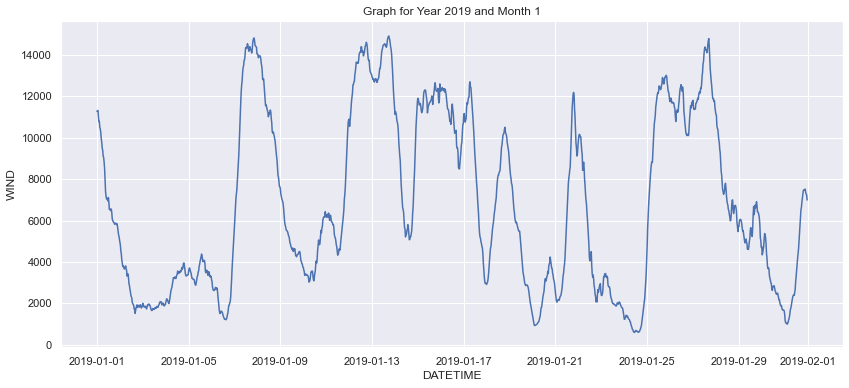

In [14]:

plot_graph_for_year_and_month(df, 'DATETIME', 'WIND', 2019, 1,(14,6))


In [15]:

def plot_graph_for_week(gen_data,x_col, y_col, year, week):
   
    # Filter the data for the specified year and week
    data_week = gen_data[(gen_data[x_col].dt.year == year) & (gen_data[x_col].dt.week == week)]

    # Set seaborn style
    sns.set(style='darkgrid')

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10,8))

    # Plot the graph
    sns.lineplot(x=data_week[x_col], y=data_week[y_col], ax=ax)

    # Set plot title and axis labels
    plt.title(f'Graph for Week {week} of {year}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)

    # Display the plot
    plt.show()


In [16]:

def plot_graph_for_year(gen_data,x_col, y_col, year):
   
    # Filter the data for the specified year and week
    data_week = gen_data[(gen_data[x_col].dt.year == year)]

    # Set seaborn style
    sns.set(style='darkgrid')

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10,8))

    # Plot the graph
    sns.lineplot(x=data_week[x_col], y=data_week[y_col], ax=ax)

    # Set plot title and axis labels
    plt.title(f'Graph for Week of {year}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)

    # Display the plot
    plt.show()


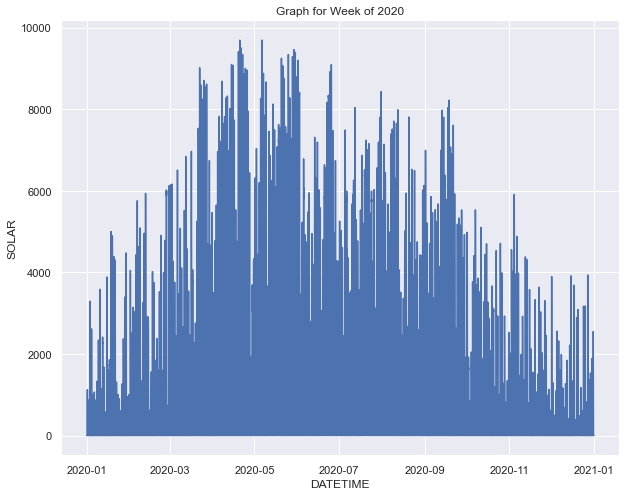

In [17]:
plot_graph_for_year(df,'DATETIME','SOLAR',2020)

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_45504/3288707303.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  data_week = gen_data[(gen_data[x_col].dt.year == year) & (gen_data[x_col].dt.week == week)]


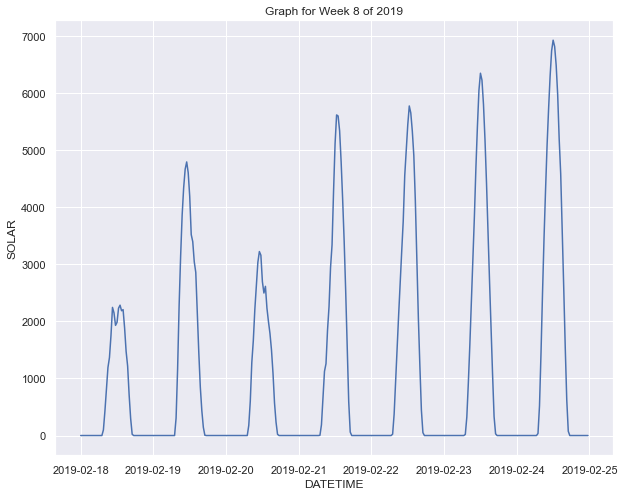

In [18]:
plot_graph_for_week(df,'DATETIME','SOLAR',2019,8)


In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histogram_for_column_all_years(data, column_name, bins=10, figsize=(15, 10)):
    """
    Plot histograms for a specific column in the DataFrame for all years using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the column to plot.
        - column_name (str): The name of the column for which to create the histograms.
        - bins (int, optional): Number of bins for the histograms. Default is 10.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 10).

    Returns:
        None (displays the plots).
    """
    # Get unique years in the data
    
    years = (data['DATETIME'].dt.year).unique()

    # Calculate the number of rows and columns for the subplots
    num_rows = len(years) // 3
    if len(years) % 3 != 0:
        num_rows += 1

    # Create subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=figsize)
    axes = axes.flatten()

    # Loop through each year and plot histogram for the specified column
    for i, year in enumerate(years):
        data_for_year = data[(data['DATETIME'].dt.year) == year]
        sns.histplot(data_for_year[column_name], bins=bins, kde=True, ax=axes[i])
        axes[i].set_title(f'Histogram of {column_name} - Year {year}')
        axes[i].set_xlabel(column_name)

    # Remove any empty subplots
    for i in range(len(years), num_rows * 3):
        fig.delaxes(axes[i])

    # Adjust layout and spacing
    plt.tight_layout()

    # Display the plots
    plt.show()


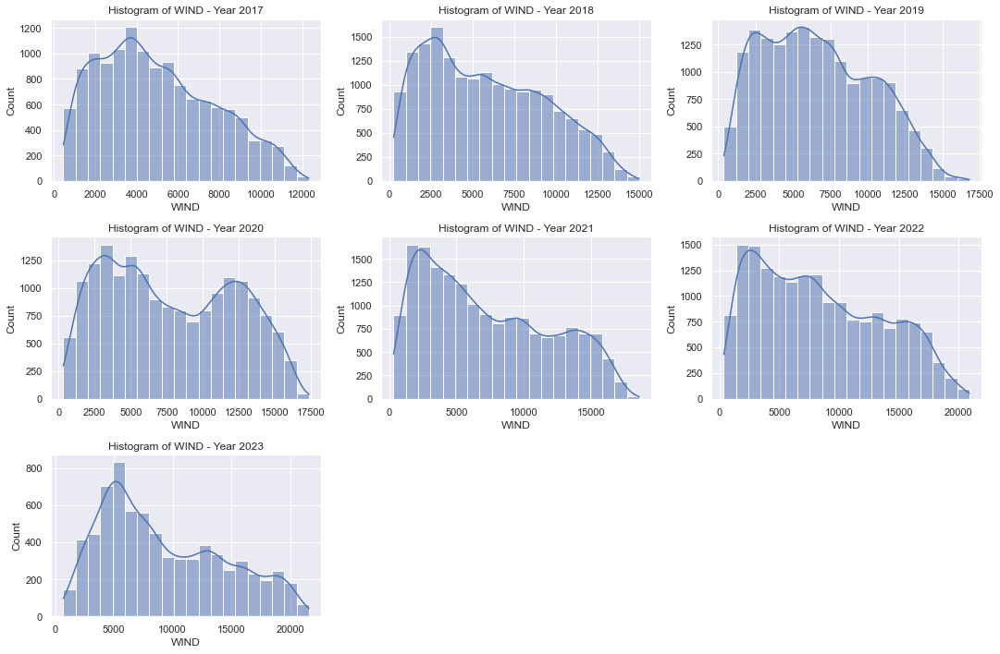

In [20]:
plot_histogram_for_column_all_years(df, column_name = 'WIND', bins=20, figsize=(15, 10))


In [21]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [22]:
data = df[['DATETIME','TSD','EMBEDDED_WIND_GENERATION',
       'EMBEDDED_SOLAR_GENERATION',
        'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
        'BIOMASS', 'OTHER', 
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']]

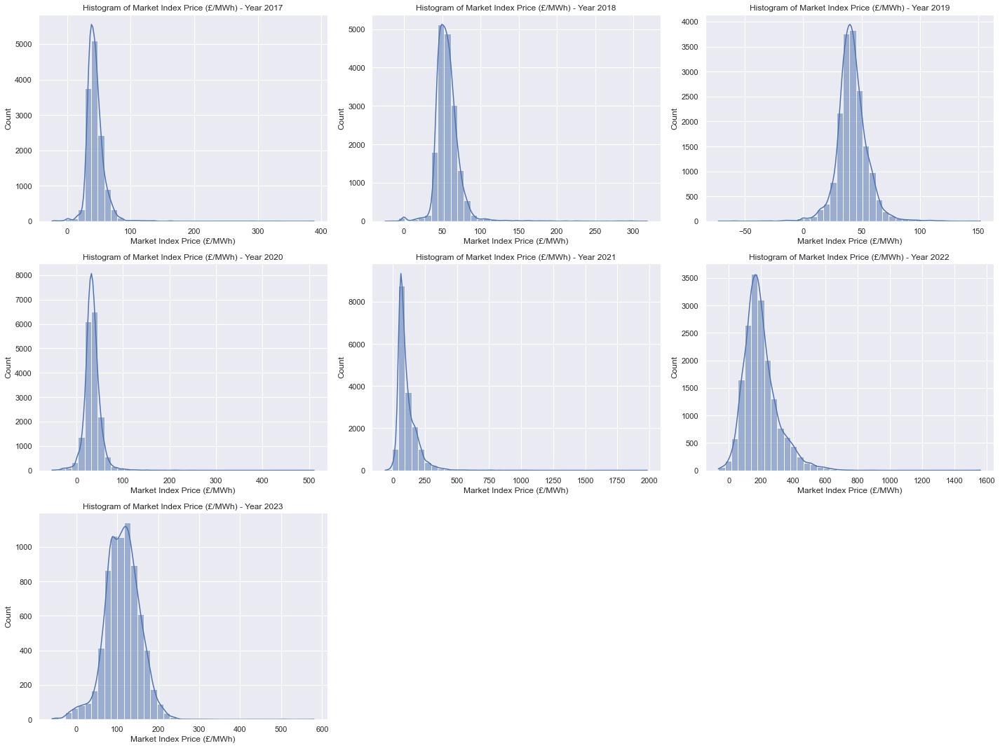

In [23]:
plot_histogram_for_column_all_years(data, column_name = 'Market Index Price (£/MWh)', bins=40, figsize=(20, 15))


In [24]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histogram_for_all_columns(data, bins=50, figsize=(20, 20)):
    """
    Plot histograms for all columns in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data for which to create the histograms.
        - bins (int, optional): Number of bins for the histograms. Default is 10.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 10).

    Returns:
        None (displays the plots).
    """
    # Calculate the number of rows and columns for the subplots
    num_rows = len(data.columns) // 3
    if len(data.columns) % 3 != 0:
        num_rows += 1

    # Create subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=figsize)
    axes = axes.flatten()

    # Loop through each column and plot histogram
    for i, col in enumerate(data.columns):
        sns.histplot(data[col], bins=bins, kde=True, ax=axes[i])
        axes[i].set_title(f'Histogram of {col}')
        axes[i].set_xlabel(col)

    # Remove any empty subplots
    for i in range(len(data.columns), num_rows * 3):
        fig.delaxes(axes[i])

    # Adjust layout and spacing
    plt.tight_layout()

    # Display the plots
    plt.show()


In [27]:
fg = df[['TSD',
       'EMBEDDED_WIND_GENERATION', 
       'EMBEDDED_SOLAR_GENERATION', 
        'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 
       'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']]

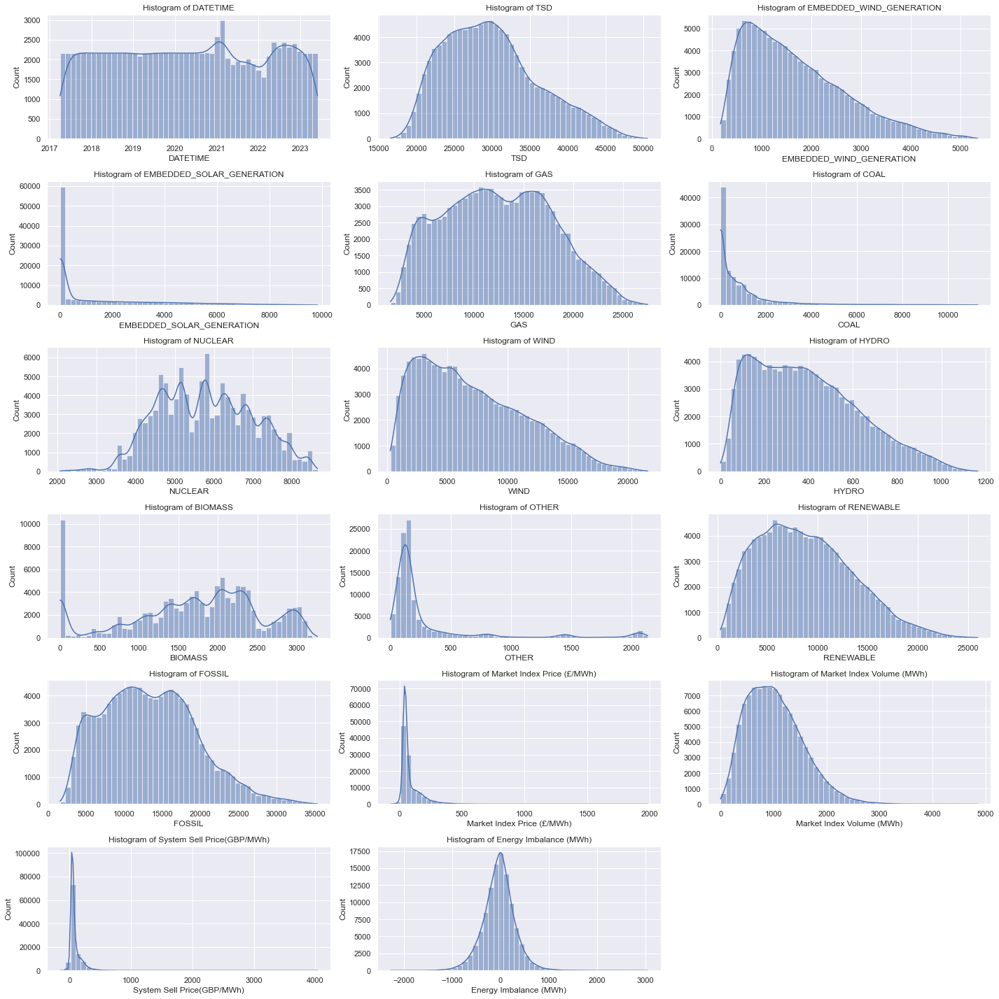

In [28]:
plot_histogram_for_all_columns(data)

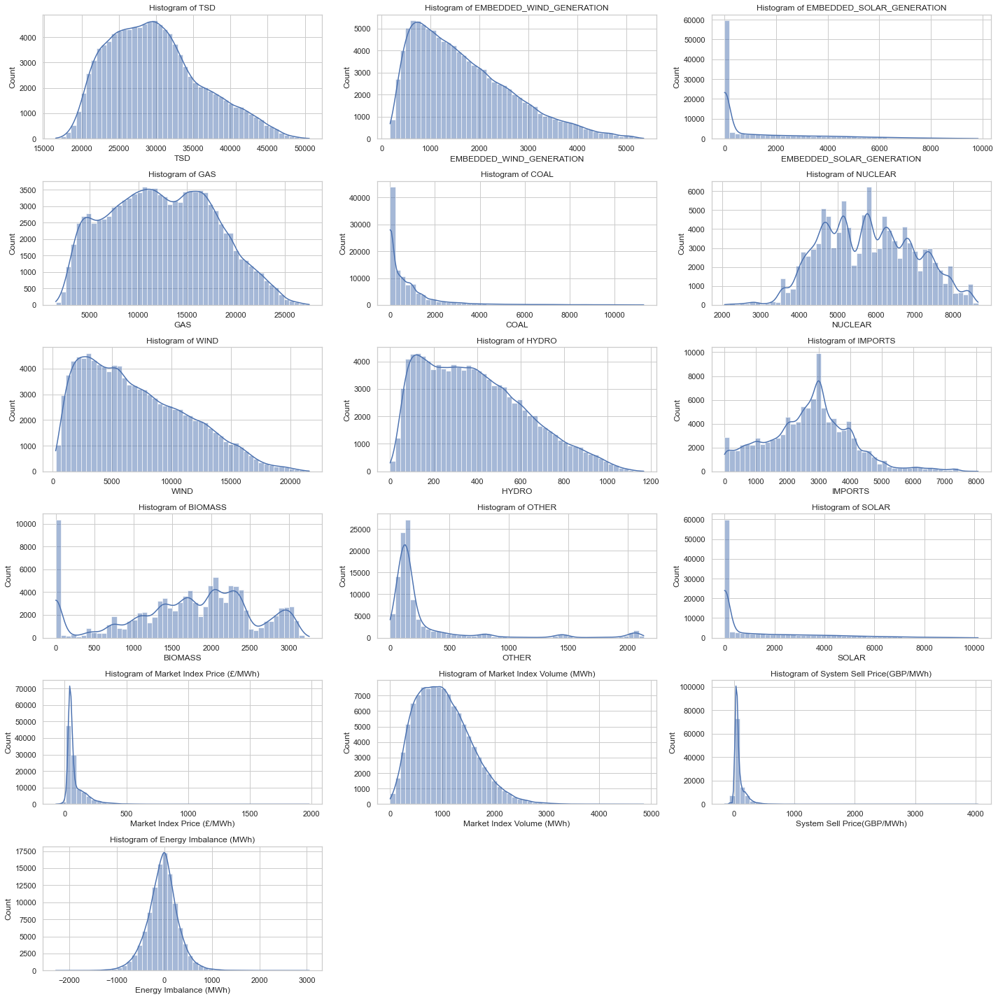

In [44]:
# Assuming you have a DataFrame called 'df'
# Call the function to plot all histograms
plot_histogram_for_all_columns(fg)


## Box Plots

In [66]:
def plot_specific_week_boxplots(data, x_col, y_col, year, week, figsize=(10, 6)):
    """
    Plot multiple box plots for each day of the week in a specific year and week
    in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the columns to plot.
        - x_col (str): The column name for the x-axis values (assumed to be of datetime type).
        - y_col (str): The column name for the y-axis values.
        - year (int): The desired year to plot.
        - week (int): The desired week number to plot.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (10, 6).

    Returns:
        None (displays the plot).
    """
    # Filter the data for the specified year and week
    data_week = data[(data[x_col].dt.year == year) & (data[x_col].dt.isocalendar().week == week)].copy()

    # Extract year, week, and day of the week name from the datetime column using .loc
    data_week.loc[:, 'Year'] = data_week[x_col].dt.year
    data_week.loc[:, 'Week'] = data_week[x_col].dt.isocalendar().week
    data_week.loc[:, 'DayOfWeek'] = data_week[x_col].dt.day_name()

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'DayOfWeek'
    sns.boxplot(x='DayOfWeek', y=y_col, data=data_week, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Day of Week in Week {week} of {year} - {y_col}')
    plt.xlabel('Day of Week')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Year', 'Week', and 'DayOfWeek' columns
    data_week.drop(columns=['Year', 'Week', 'DayOfWeek'], inplace=True)



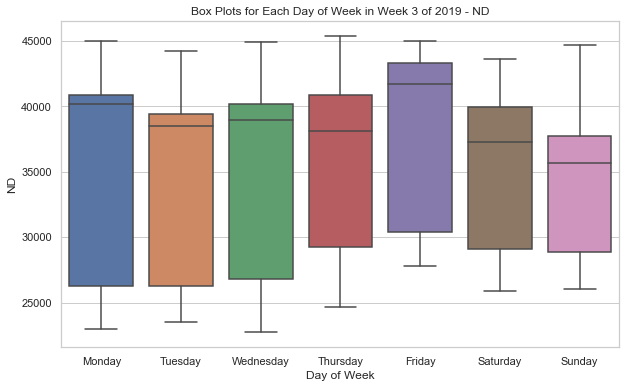

In [68]:
plot_specific_week_boxplots(df,x_col = 'DATETIME', 
                            y_col = 'ND', year = 2019,week = 3)


In [71]:
# all weeks of mondays to see for all the year 

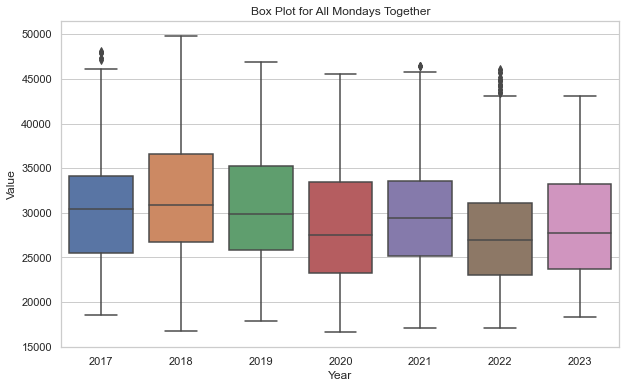

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have a DataFrame called 'df' with a column named 'DATETIME' containing datetime objects
# Convert the 'DATETIME' column to datetime-like data type (if not already done)
df['DATETIME'] = pd.to_datetime(df['DATETIME'])

# Filter the data to include only the Mondays
day_data = df[df['DATETIME'].dt.weekday == 3]

# Create a box plot for all the Mondays together
plt.figure(figsize=(10, 6))
sns.boxplot(x=day_data['DATETIME'].dt.year, y=day_data['ND'])
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Box Plot for All Mondays Together')
plt.show()


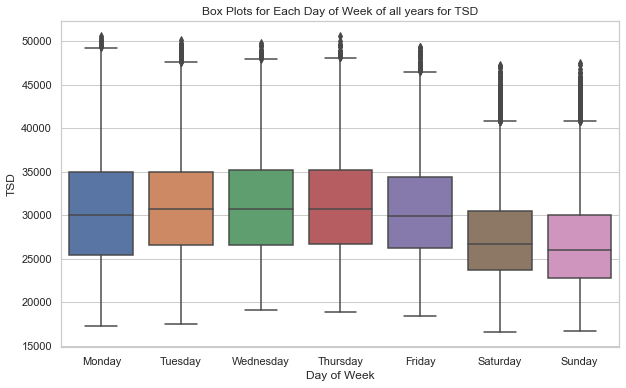

In [91]:
def plot_boxplots(data, x_col, y_col, figsize=(10, 6)):
    """
    Plot multiple box plots for each day of the week in a specific year and week
    in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the columns to plot.
        - x_col (str): The column name for the x-axis values (assumed to be of datetime type).
        - y_col (str): The column name for the y-axis values.
        - year (int): The desired year to plot.
        - week (int): The desired week number to plot.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (10, 6).

    Returns:
        None (displays the plot).
    """
    # Filter the data for the specified year and week
    data_week = data.copy()

    # Extract year, week, and day of the week name from the datetime column using .loc
    data_week.loc[:, 'Year'] = data_week[x_col].dt.year
    data_week.loc[:, 'Week'] = data_week[x_col].dt.isocalendar().week
    data_week.loc[:, 'DayOfWeek'] = data_week[x_col].dt.day_name()

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'DayOfWeek'
    sns.boxplot(x='DayOfWeek', y=y_col, data=data_week, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Day of Week of all years for {y_col}')
    plt.xlabel('Day of Week')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Year', 'Week', and 'DayOfWeek' columns
    data_week.drop(columns=['Year', 'Week', 'DayOfWeek'], inplace=True)



plot_boxplots(data = df, x_col = 'DATETIME', y_col = 'TSD', figsize=(10, 6))

In [64]:
# Assuming 'combined' is your DataFrame with the time series data
# and 'DATETIME' is the datetime column (index of the DataFrame)
# and 'WIND' is the column you want to plot

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_all_year_weeks_boxplots(data, x_col, y_col, x ,figsize=(15, 8)):
    """
    Plot multiple box plots for each Monday across all years in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the columns to plot.
        - x_col (str): The column name for the x-axis values (assumed to be of datetime type).
        - y_col (str): The column name for the y-axis values.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 8).

    Returns:
        None (displays the plot).
    """
    # Filter the data for Mondays
    mondays = data[data[x_col].dt.weekday == x].copy()

    # Extract the year and week from the datetime column
    mondays.loc[:, 'Year'] = mondays[x_col].dt.year
    mondays.loc[:, 'Week'] = mondays[x_col].dt.isocalendar().week

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'Year'
    sns.boxplot(x='Year', y=y_col, data=mondays)
    
    x_day = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    # Set plot title and axis labels
    plt.title('Box Plots for Monday Across All Years')
    plt.xlabel(f'Weekday ({x_day[x]}s of Each Year)')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Year' and 'Week' columns
    mondays.drop(columns=['Year', 'Week'], inplace=True)




In [62]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)',
       'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed', 'TSD_Values_Transformed',
       'PUMP_STORAGE_PUMPING_Values_Transformed', 'GAS_Values_Transformed',
       'COAL_Values_Transformed', 'NUCLEAR_Values_Transformed',
       'WIND_Values_Transformed', 'HYDRO_Values_Transformed',
       'IMPORTS_Values_Transformed', 'BIOMASS_Values_Transformed',
 

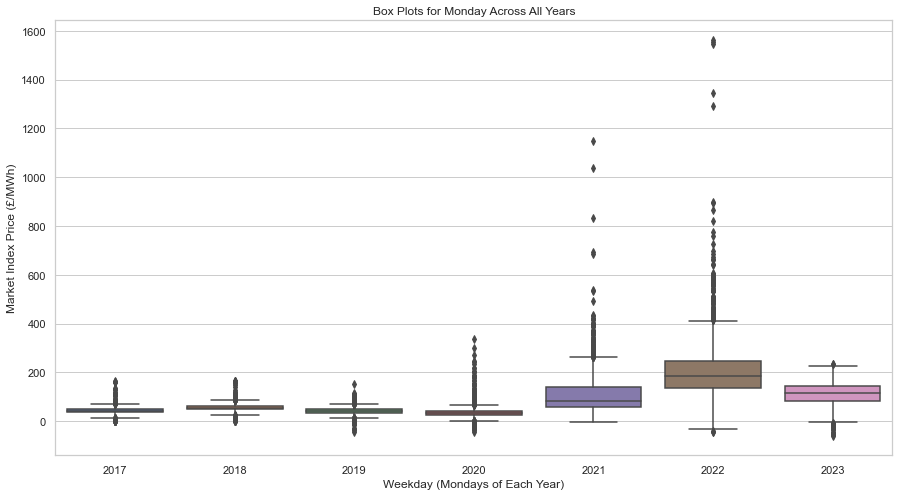

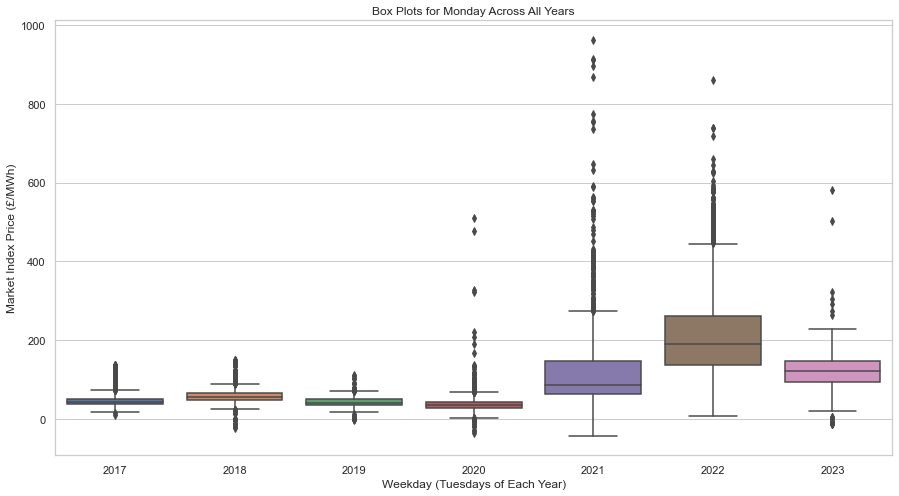

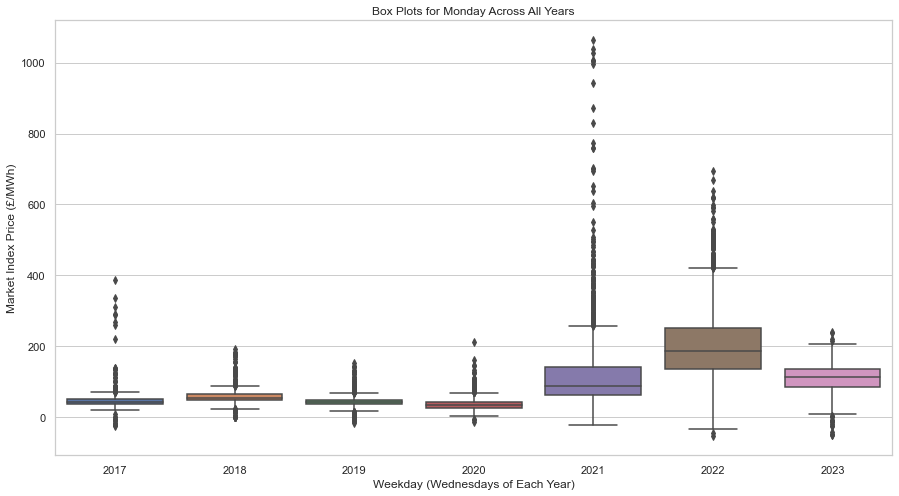

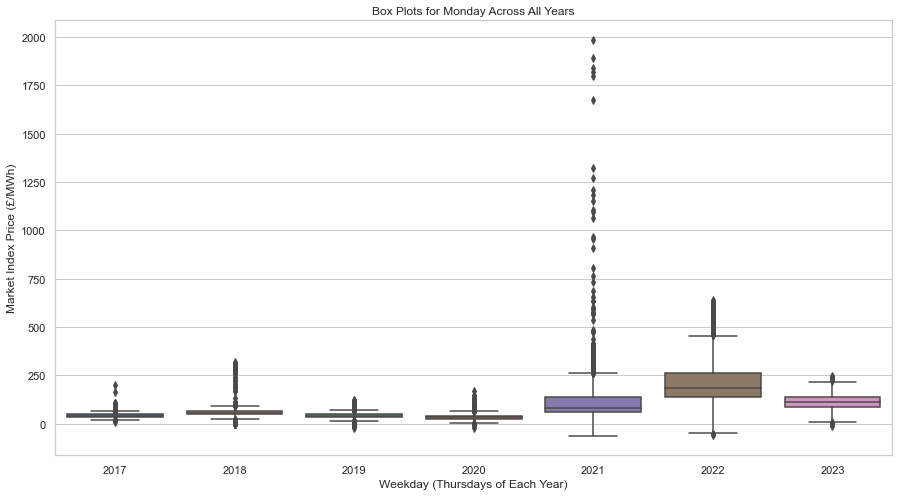

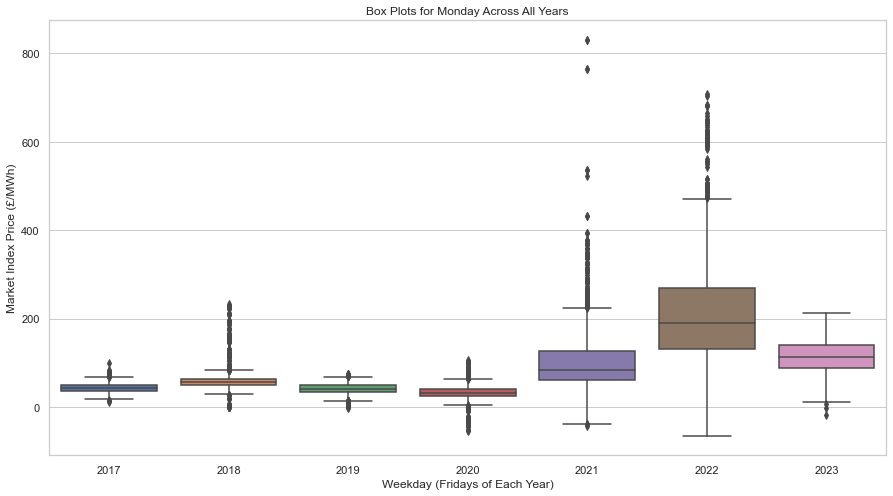

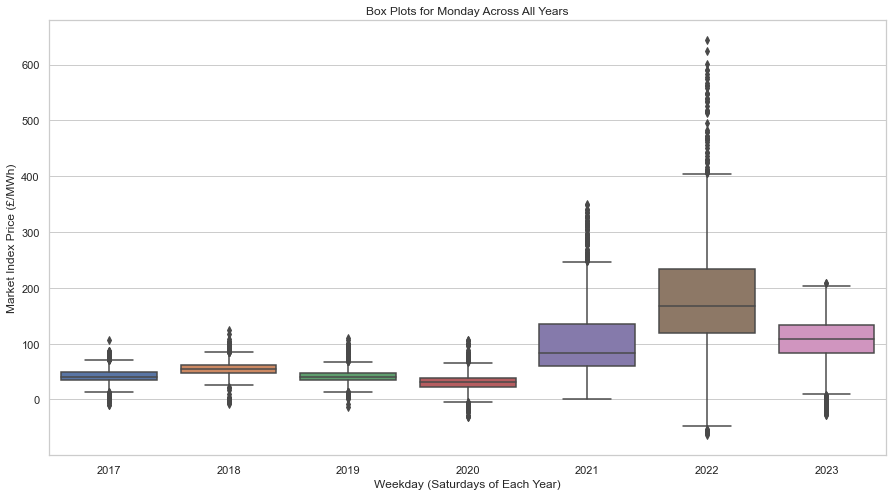

In [65]:
# Plot box plots for all Mondays in the DataFrame
for i in range(0,6):
    plot_all_year_weeks_boxplots(df, 'DATETIME', 'Market Index Price (£/MWh)', i)

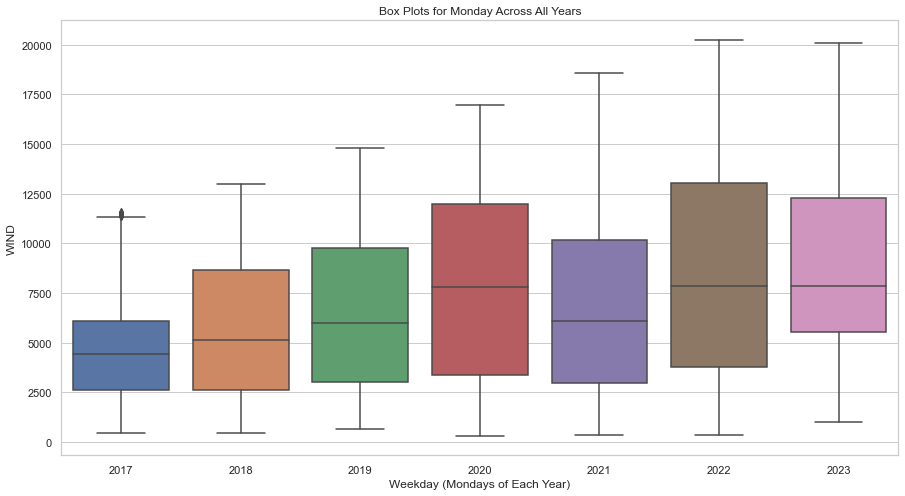

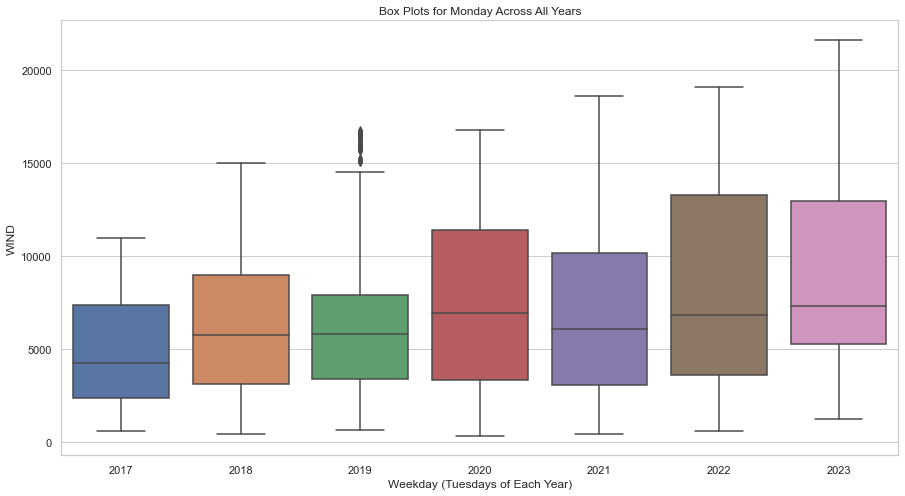

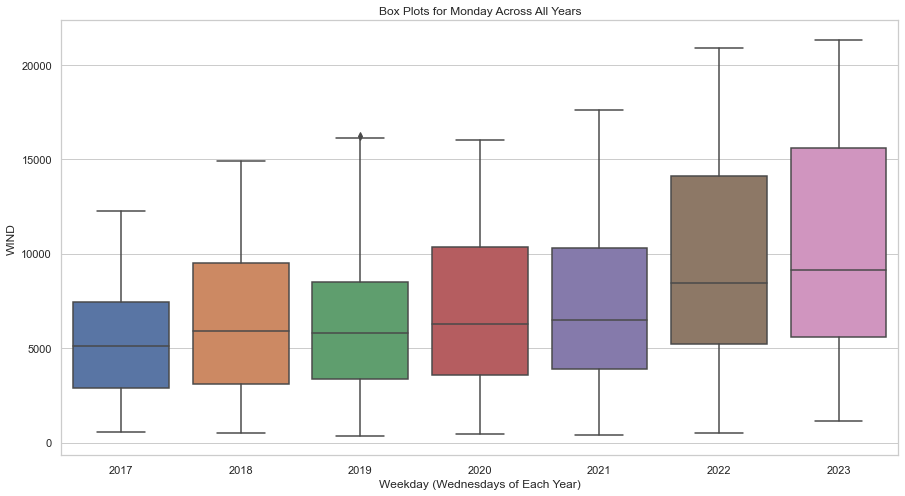

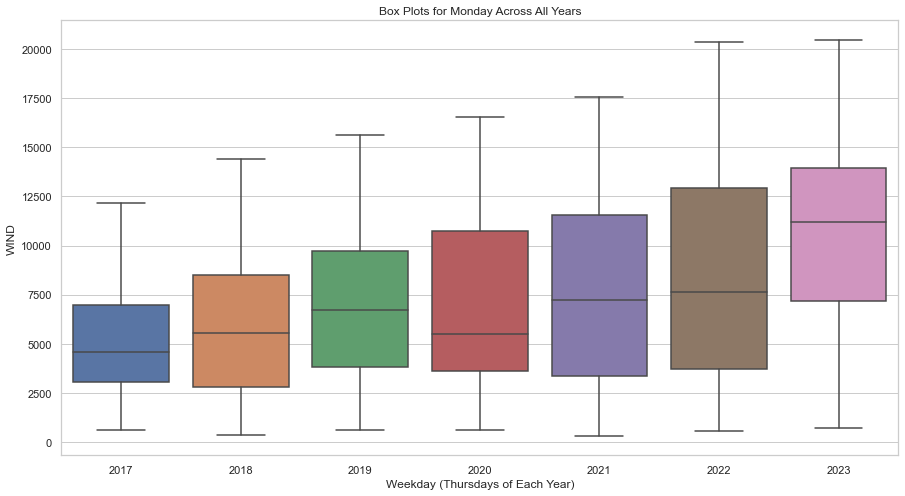

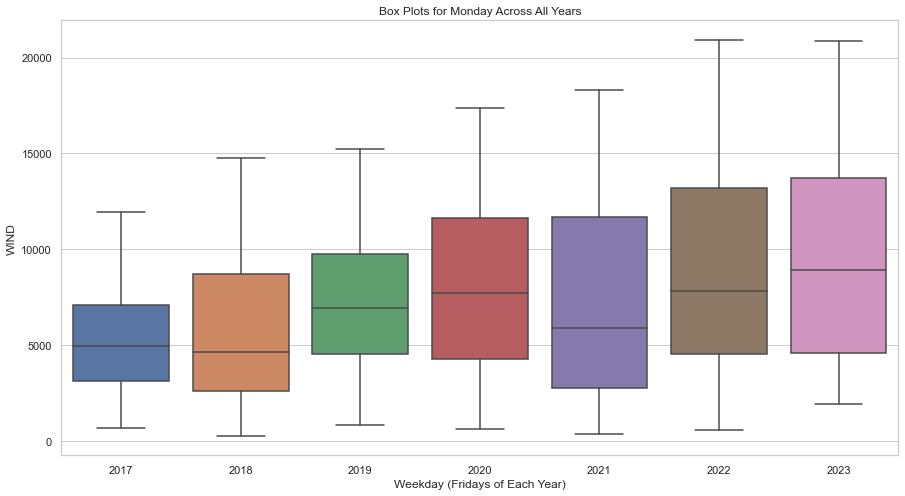

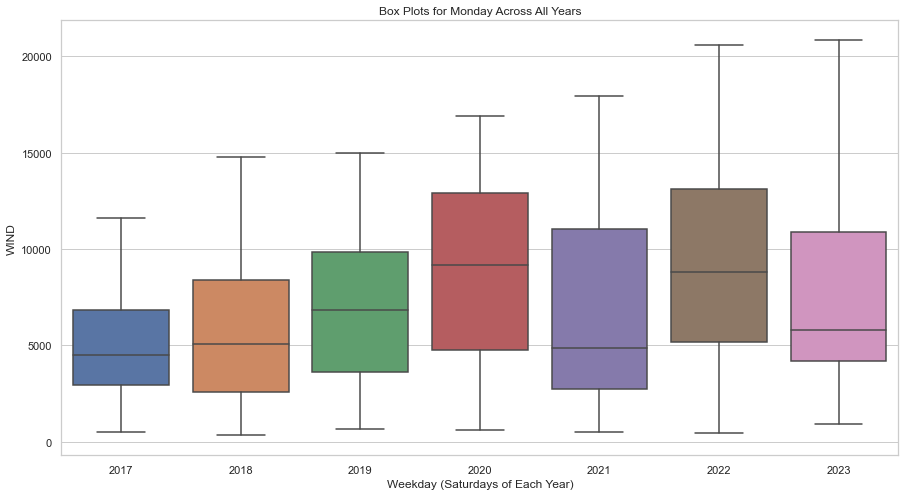

In [209]:
for i in range(0,6):
    plot_all_year_weeks_boxplots(combined, 'DATETIME', 'WIND', i)

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_boxplots_months_specific_year(data, x_col, y_col, year, figsize=(10, 6)):
    """
    Plot multiple box plots for each month of a specific year in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the columns to plot.
        - x_col (str): The column name for the x-axis values (assumed to be of datetime type).
        - y_col (str): The column name for the y-axis values.
        - year (int): The specific year to filter the data.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (10, 6).

    Returns:
        None (displays the plot).
    """
    # Filter the data for the specified year
    data_year = data[data[x_col].dt.year == year]

    # Extract month and year from the datetime column using .dt accessor
    data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'Month'
    sns.boxplot(x='Month_Name', y=y_col, data=data_year)

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Month of {year} for {y_col}')
    plt.xlabel('Month')
    plt.ylabel(y_col)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)

    # Display the plot
    plt.show()

    # Remove the temporary 'Month_Name' column
    data_year.drop(columns=['Month_Name'], inplace=True)

# Example usage:
# Assuming 'data' is your DataFrame containing the datetime column 'Date' and the column 'y_col' to plot.
# Replace 'y_col' with the actual column name you want to plot.

# Specify the year you want to plot (e.g., 2023)
# plot_boxplots_months_specific_year(data, 'Date', 'y_col', year=2023)


/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


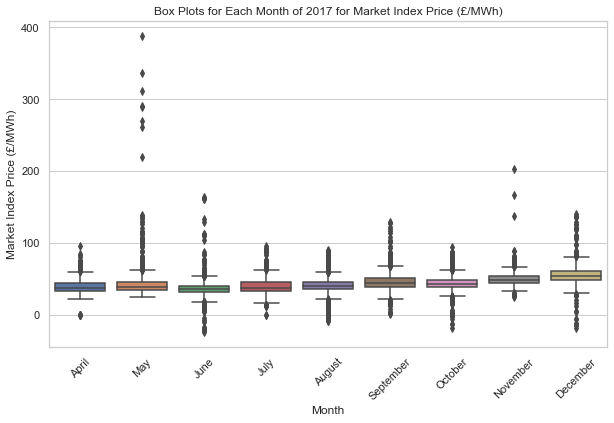

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


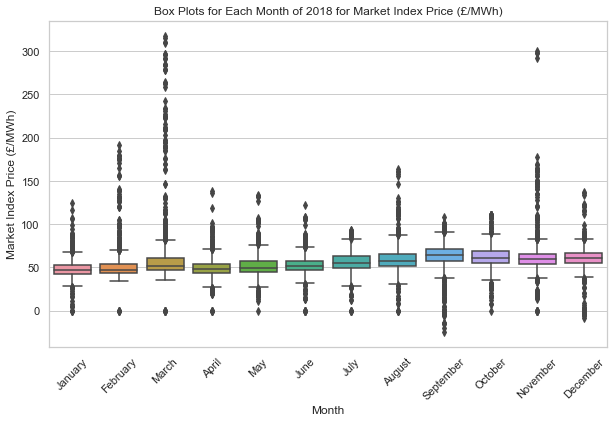

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


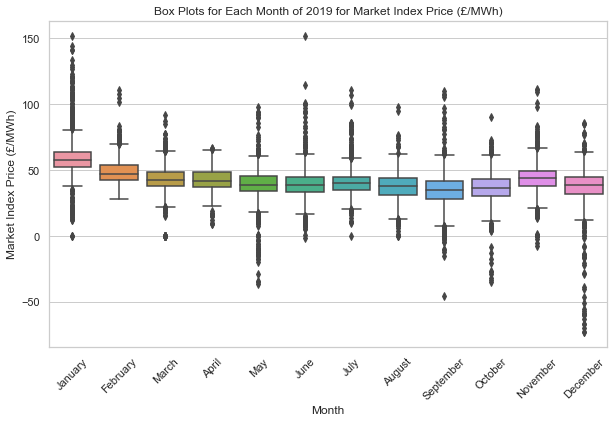

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


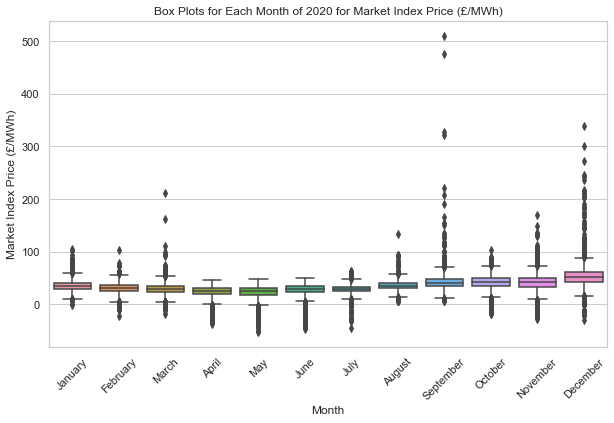

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


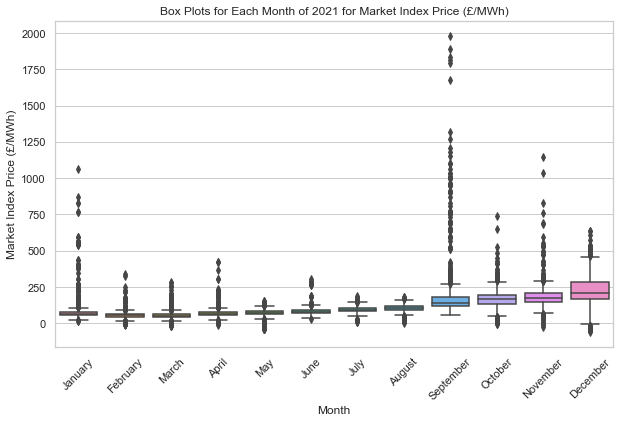

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


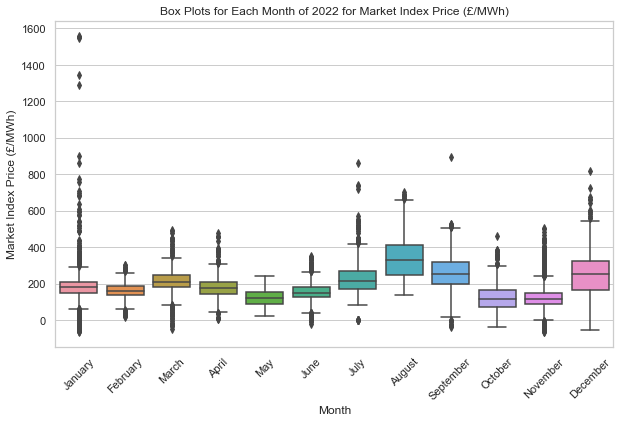

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year['Month_Name'] = data_year[x_col].dt.strftime('%B')


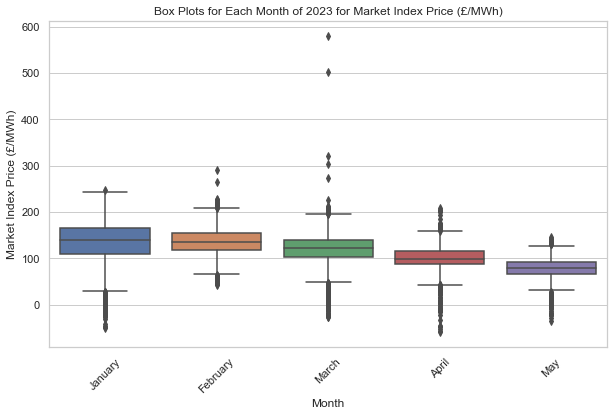

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_49944/1004413263.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_year.drop(columns=['Month_Name'], inplace=True)


In [75]:
for x in range(2017,2024):
    plot_boxplots_months_specific_year(data, x_col = 'DATETIME', y_col = 'Market Index Price (£/MWh)', year = x, figsize=(10, 6))

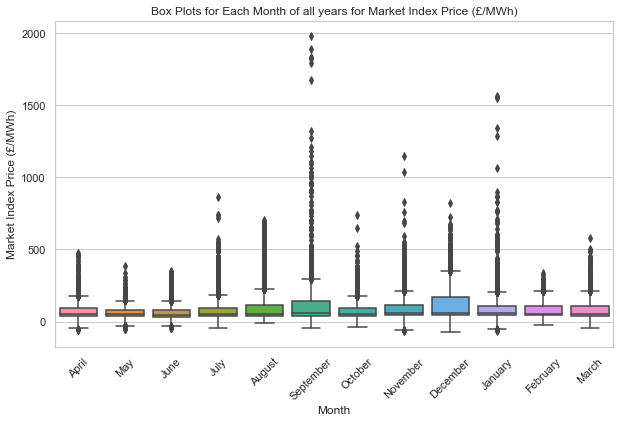

In [27]:
plot_boxplots_months(df, x_col = 'DATETIME', y_col = 'Market Index Price (£/MWh)', figsize=(10, 6))

In [76]:
plot_boxplots_months_all_years(data, 'DATETIME', 'Market Index Price (£/MWh)')


NameError: name 'plot_boxplots_months_all_years' is not defined

<Axes: xlabel='Market Index Price (£/MWh)', ylabel='Count'>

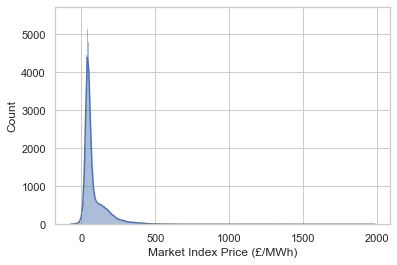

In [30]:
sns.histplot(df['Market Index Price (£/MWh)'],kde=True)


In [126]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def get_season(month):
    """
    Get the season based on the month.

    Parameters:
        - month (int): The month number (1 to 12).

    Returns:
        str: The season (Winter, Spring, Summer, or Autumn/Fall).
    """
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn/Fall'

def plot_boxplots_seasons(data, x_col, y_col, figsize=(10, 6)):
    """
    Plot multiple box plots for each season in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the columns to plot.
        - x_col (str): The column name for the x-axis values (assumed to be of datetime type).
        - y_col (str): The column name for the y-axis values.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (10, 6).

    Returns:
        None (displays the plot).
    """
    # Filter the data for the specified year and week
    data_season = data.copy()

    # Extract month and year from the datetime column using .dt accessor
    data_season['Month'] = data_season[x_col].dt.month

    # Get the season for each month using the get_season function
    data_season['Season'] = data_season['Month'].apply(get_season)

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'Season'
    sns.boxplot(x='Season', y=y_col, data=data_season)

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Season of all years for {y_col}')
    plt.xlabel('Season')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Month' and 'Season' columns
    data_season.drop(columns=['Month', 'Season'], inplace=True)


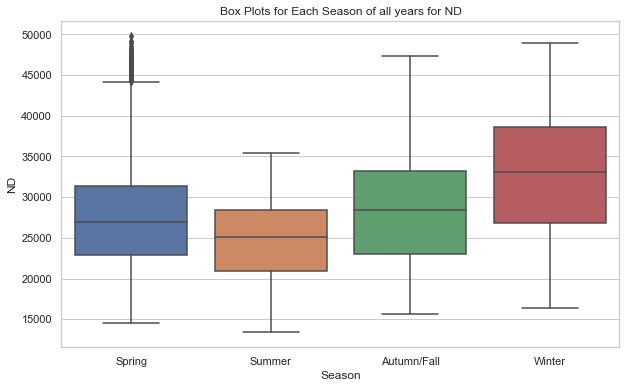

In [109]:
# Assuming you have a DataFrame called 'df'
# Call the function to plot box plots for all seasons
plot_boxplots_seasons(df, 'DATETIME', 'ND')


In [127]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def get_season(month):
    """
    Get the season based on the month.

    Parameters:
        - month (int): The month number (1 to 12).

    Returns:
        str: The season (Winter, Spring, Summer, or Autumn/Fall).
    """
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn/Fall'

def plot_boxplots_seasons(data, x_col, y_col, figsize=(10, 6)):
    """
    Plot multiple box plots for each season in the DataFrame using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the columns to plot.
        - x_col (str): The column name for the x-axis values (assumed to be of datetime type).
        - y_col (str): The column name for the y-axis values.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (10, 6).

    Returns:
        None (displays the plot).
    """
    # Filter the data for the specified year and week
    data_season = data.copy()

    # Extract month and year from the datetime column using .dt accessor
    data_season['Year'] = data_season[x_col].dt.year
    data_season['Month'] = data_season[x_col].dt.month

    # Get the season for each month using the get_season function
    data_season['Season'] = data_season['Month'].apply(get_season)

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'Season'
    sns.boxplot(x='Season', y=y_col, data=data_season)

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Season of all years for {y_col}')
    plt.xlabel('Season')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Month' and 'Season' columns
    data_season.drop(columns=['Year','Month','Season'], inplace=True)


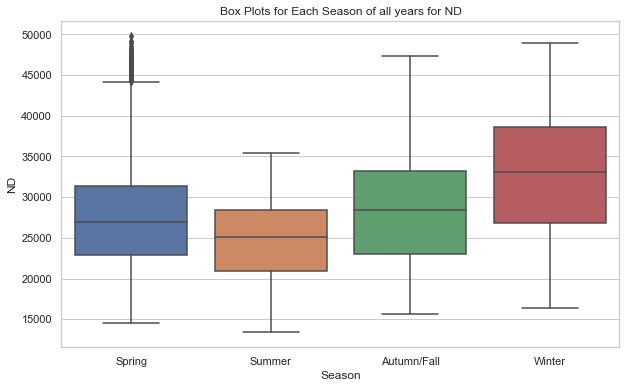

In [14]:
plot_boxplots_seasons(df, 'DATETIME', 'ND')

In [123]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


def plot_boxplots_seasons_all_years(data, x_col, y_col, figsize=(10, 6)):
    # Function to plot box plots for each season for all years in the DataFrame using Seaborn
    # (same as before, but removing the data_season filtering for a specific year and week)

    # Extract month and year from the datetime column using .dt accessor
    data['Year'] = data[x_col].dt.year
    data['Month'] = data[x_col].dt.month

    # Get the season for each month using the get_season function
    data['Season'] = data['Month'].apply(get_season)

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'Season'
    sns.boxplot(x='Season', y=y_col,hue = 'Year', data=data)

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Season of all years for {y_col}')
    plt.xlabel('Season')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Month' and 'Season' columns
    data.drop(columns=['Year', 'Month', 'Season'], inplace=True)

# Example usage:
# Assuming 'data' is your DataFrame containing the datetime column 'Date' and the column 'y_col' to plot.
# Replace 'y_col' with the actual column name you want to plot.

# plot_boxplots_seasons_all_years(data, 'Date', 'y_col')


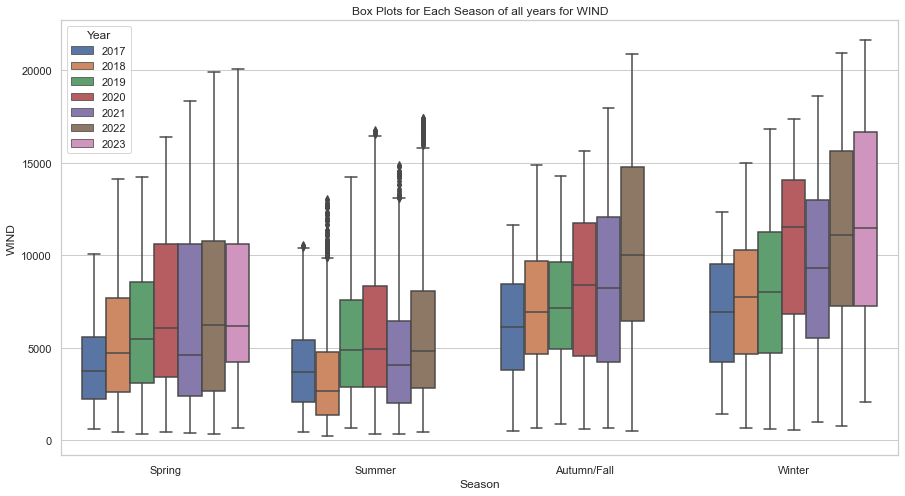

In [23]:
plot_boxplots_seasons_all_years(df, 'DATETIME', 'WIND',figsize=(15,8))

In [121]:
COL = ['TSD','SOLAR','WIND','HYDRO','BIOMASS','Market Index Price (£/MWh)', 'Market Index Volume (MWh)',
'System Sell Price(GBP/MWh)','Energy Imbalance (MWh)']

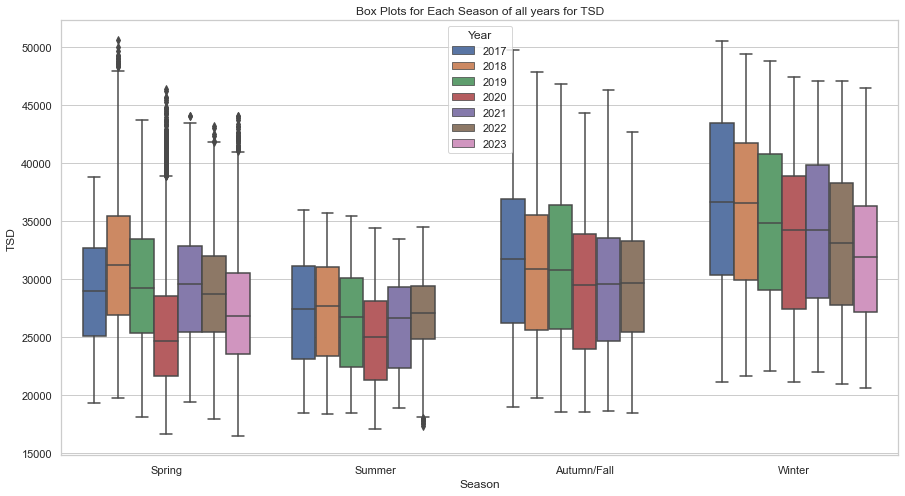

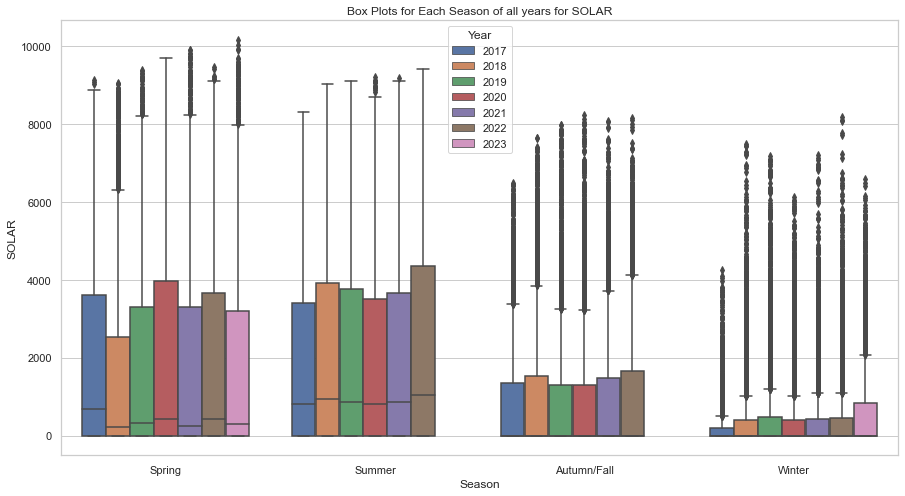

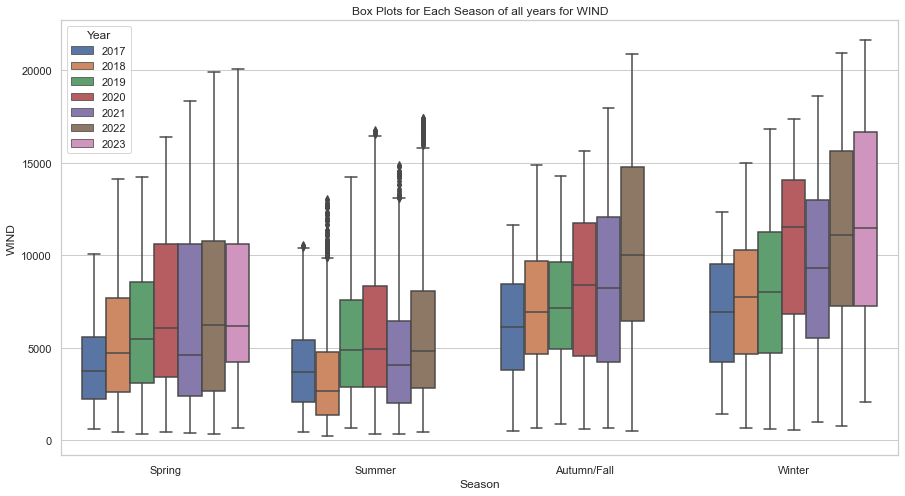

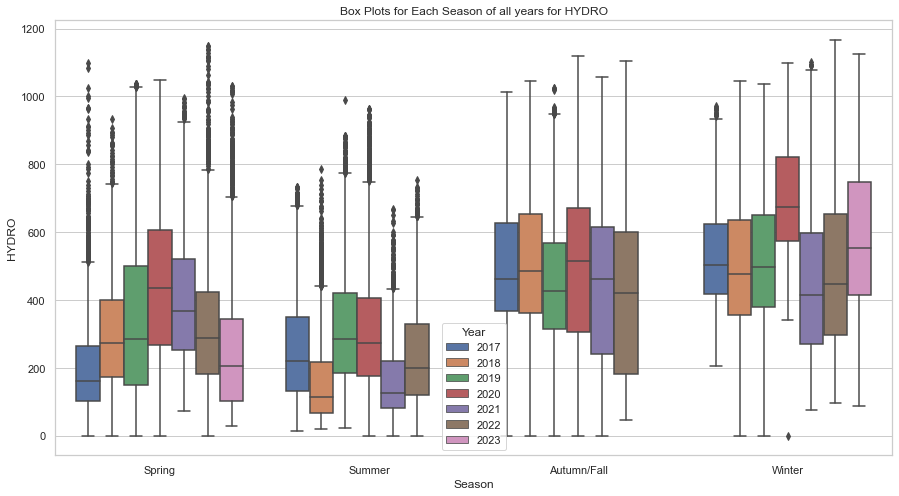

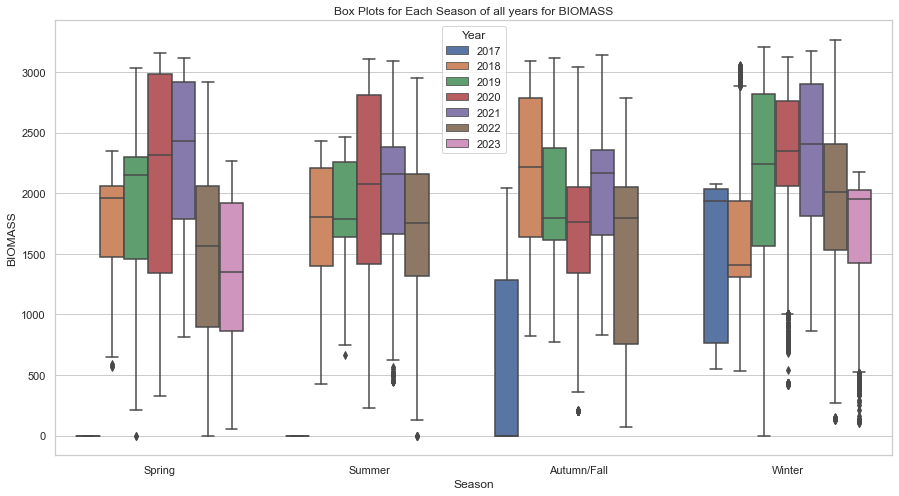

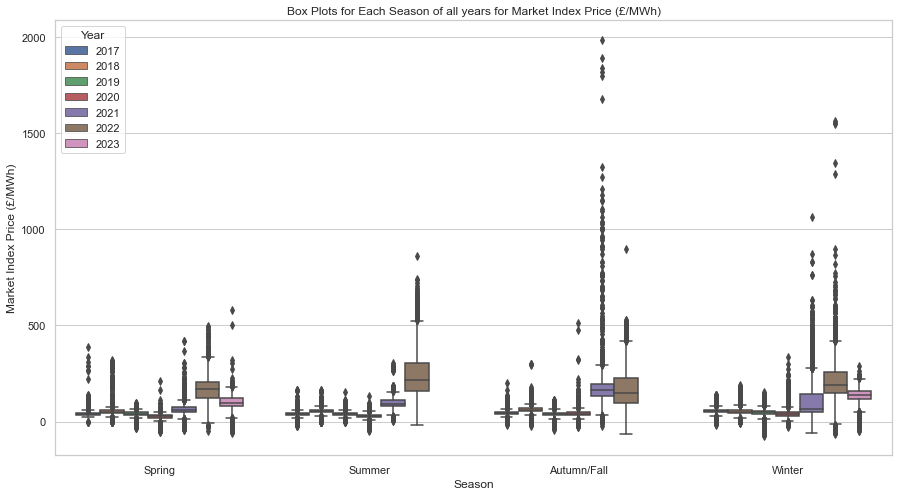

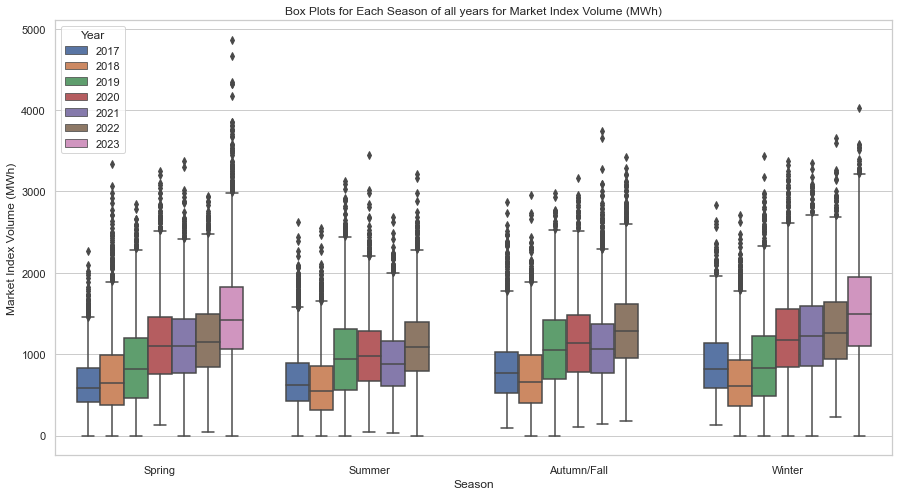

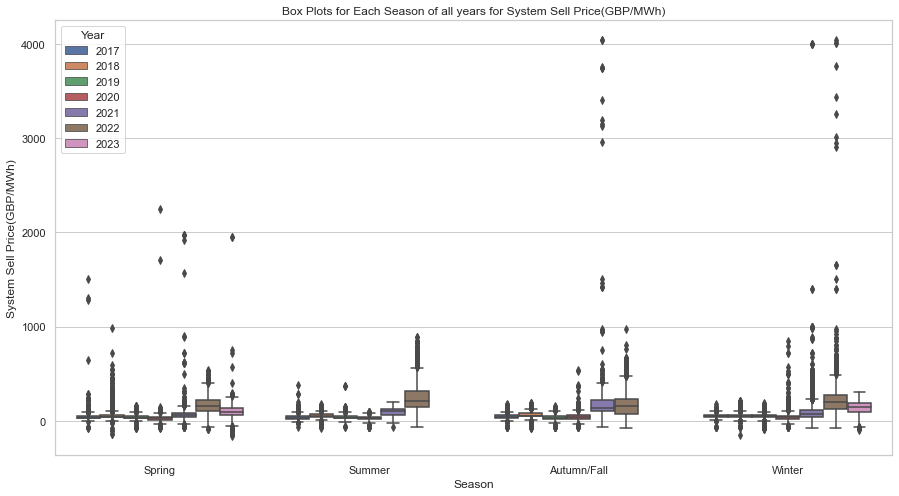

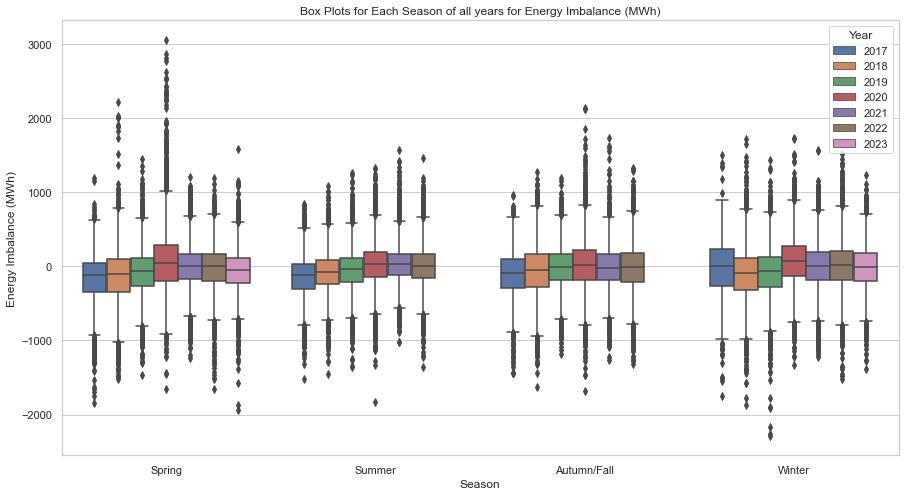

In [134]:
from matplotlib.backends.backend_pdf import PdfPages

with PdfPages('box_plots_all_columns.pdf') as pdf:
    for i in COL:
        # Create the box plot
        plot_boxplots_seasons_all_years(df, 'DATETIME', i, figsize=(15, 8))
        
        # Add the current plot to the PDF
        pdf.savefig(fig)
        
        # Close the current plot to avoid overwriting
        plt.close()

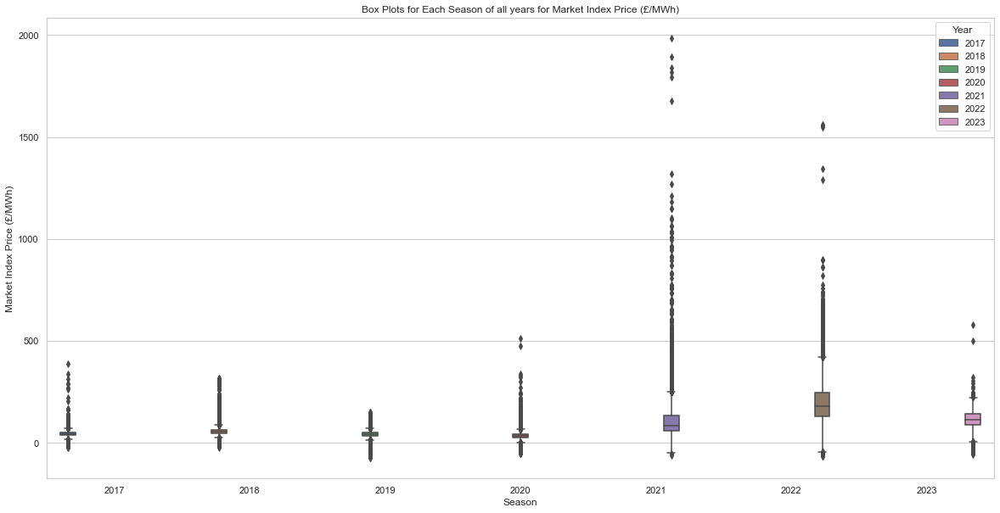

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


def plot_boxplots_seasons_all_years(data, x_col, y_col, figsize=(20,10)):
    # Function to plot box plots for each season for all years in the DataFrame using Seaborn
    # (same as before, but removing the data_season filtering for a specific year and week)

    # Extract month and year from the datetime column using .dt accessor
    data['Year'] = data[x_col].dt.year
    data['Month'] = data[x_col].dt.month

    # Get the season for each month using the get_season function
    data['Season'] = data['Month'].apply(get_season)

    # Set seaborn style
    sns.set(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the box plot using Seaborn, grouped by 'Season'
    sns.boxplot(x='Year', y=y_col,hue = 'Year', data=data)

    # Set plot title and axis labels
    plt.title(f'Box Plots for Each Season of all years for {y_col}')
    plt.xlabel('Season')
    plt.ylabel(y_col)

    # Display the plot
    plt.show()

    # Remove the temporary 'Month' and 'Season' columns
    data.drop(columns=['Year', 'Month', 'Season'], inplace=True)

# Example usage:
# Assuming 'data' is your DataFrame containing the datetime column 'Date' and the column 'y_col' to plot.
# Replace 'y_col' with the actual column name you want to plot.

plot_boxplots_seasons_all_years(data, 'DATETIME', 'Market Index Price (£/MWh)')


In [47]:
fg.shape

(108070, 16)

In [48]:
fg.columns

Index(['TSD', 'EMBEDDED_WIND_GENERATION', 'EMBEDDED_SOLAR_GENERATION', 'GAS',
       'COAL', 'NUCLEAR', 'WIND', 'HYDRO', 'IMPORTS', 'BIOMASS', 'OTHER',
       'SOLAR', 'Market Index Price (£/MWh)', 'Market Index Volume (MWh)',
       'System Sell Price(GBP/MWh)', 'Energy Imbalance (MWh)'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


data1 = df
# Applying Logarithmic Transformation
data['Log_Transformed'] = np.log(data['Values'])

# Applying Power Transformation (using power of 0.5 for square root transformation)
data['SquareRoot_Transformed'] = np.sqrt(data['Values'])

# Plotting the original, logarithmic, and square root transformed data
plt.figure(figsize=(10, 6))
plt.plot(data['Values'], label='Original')
plt.plot(data['Log_Transformed'], label='Logarithmic Transformation')
plt.plot(data['SquareRoot_Transformed'], label='Square Root Transformation')
plt.xlabel('Index')
plt.ylabel('Transformed Values')
plt.legend()
plt.title('Logarithmic and Square Root Transformations')
plt.show()


In [53]:
val = [ 'TSD',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']

In [52]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)',
       'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed'],
      dtype='object')

In [57]:
import pandas as pd
import numpy as np

# Example DataFrame
data = df

# Applying Power Transformation (using power of 2 for square transformation) only on 'Values' column
for i in val:
    data[f'{i}_Values_Transformed'] = np.log(data[i])

# Display the DataFrame to see the transformed column
data.head()

/Users/charanteja/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/charanteja/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,DATETIME,ND,TSD,ENGLAND_WALES_DEMAND,EMBEDDED_WIND_GENERATION,EMBEDDED_WIND_CAPACITY,EMBEDDED_SOLAR_GENERATION,EMBEDDED_SOLAR_CAPACITY,PUMP_STORAGE_PUMPING,GAS,...,GAS_Values_Transformed,COAL_Values_Transformed,NUCLEAR_Values_Transformed,WIND_Values_Transformed,HYDRO_Values_Transformed,IMPORTS_Values_Transformed,BIOMASS_Values_Transformed,OTHER_Values_Transformed,SOLAR_Values_Transformed,STORAGE_Values_Transformed
0,2017-04-01 00:00:00,23874,24937,21784,1159,4831,0,11750,526,8940.0,...,9.098291,6.354370,8.930626,8.173575,6.169611,7.980708,-inf,7.635304,-inf,-inf
1,2017-04-01 00:30:00,23137,24507,21095,1114,4831,0,11750,870,9269.0,...,9.134431,6.459904,8.930494,8.134761,6.173786,8.020270,-inf,7.634821,-inf,-inf
2,2017-04-01 01:00:00,23168,24751,21188,1070,4831,0,11750,1040,9297.0,...,9.137447,6.520621,8.930230,8.112827,6.173786,8.083329,-inf,7.642524,-inf,-inf
3,2017-04-01 01:30:00,23548,25148,21607,1027,4831,0,11750,1100,9148.0,...,9.121291,6.467699,8.930097,8.066835,6.173786,8.107117,-inf,7.643962,-inf,-inf
4,2017-04-01 02:00:00,23209,25404,21309,966,4831,0,11750,1695,8998.0,...,9.104758,6.364751,8.930362,8.042699,6.165418,8.099251,-inf,7.644919,-inf,-inf


In [42]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)',
       'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed'],
      dtype='object')

In [43]:
data.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)',
       'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed'],
      dtype='object')

In [38]:
co = ['Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed']

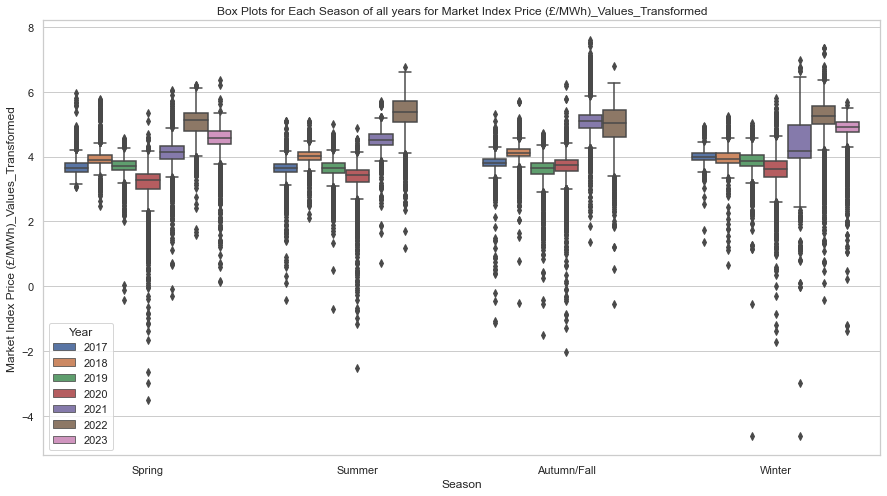

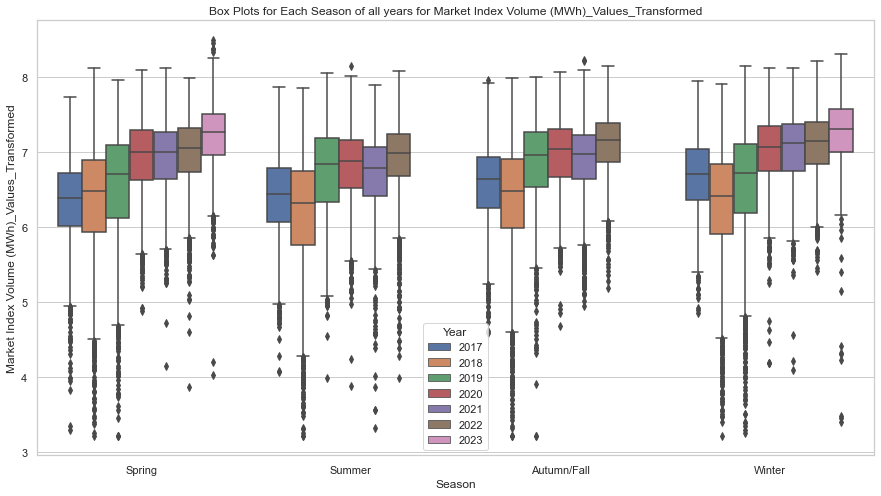

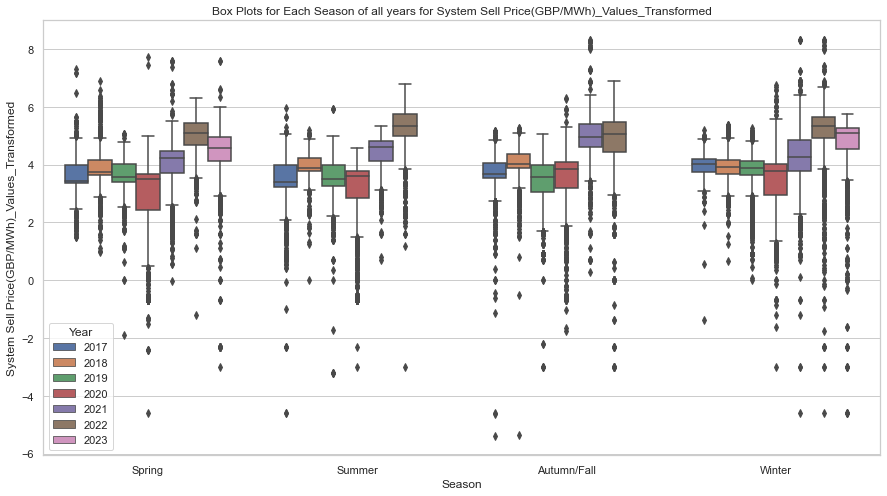

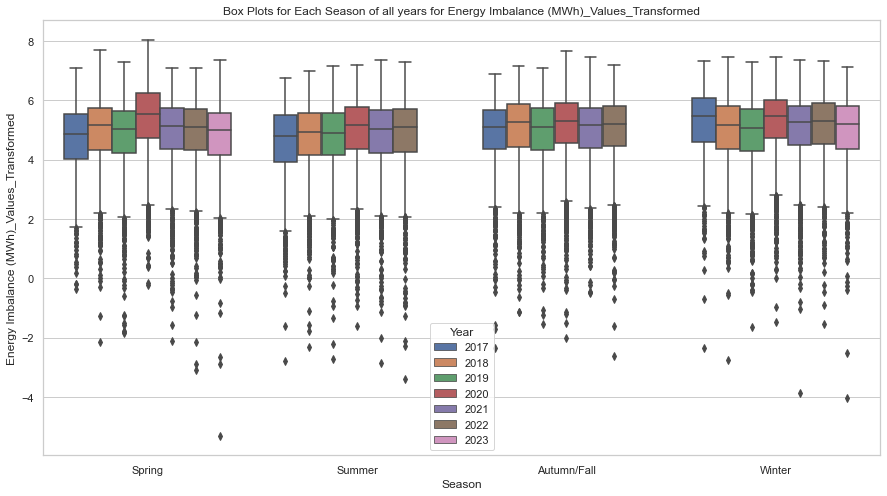

In [44]:
for i in co:
    plot_boxplots_seasons_all_years(data, 'DATETIME', i ,figsize=(15,8))

In [58]:
data.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)',
       'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed', 'TSD_Values_Transformed',
       'PUMP_STORAGE_PUMPING_Values_Transformed', 'GAS_Values_Transformed',
       'COAL_Values_Transformed', 'NUCLEAR_Values_Transformed',
       'WIND_Values_Transformed', 'HYDRO_Values_Transformed',
       'IMPORTS_Values_Transformed', 'BIOMASS_Values_Transformed',
 

In [36]:

df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [60]:
df1 = data[[ 'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed', 'TSD_Values_Transformed','GAS_Values_Transformed',
       'COAL_Values_Transformed', 'NUCLEAR_Values_Transformed',
       'WIND_Values_Transformed', 'HYDRO_Values_Transformed',
       'IMPORTS_Values_Transformed', 'BIOMASS_Values_Transformed',
       'OTHER_Values_Transformed', 'SOLAR_Values_Transformed',
       'STORAGE_Values_Transformed']]

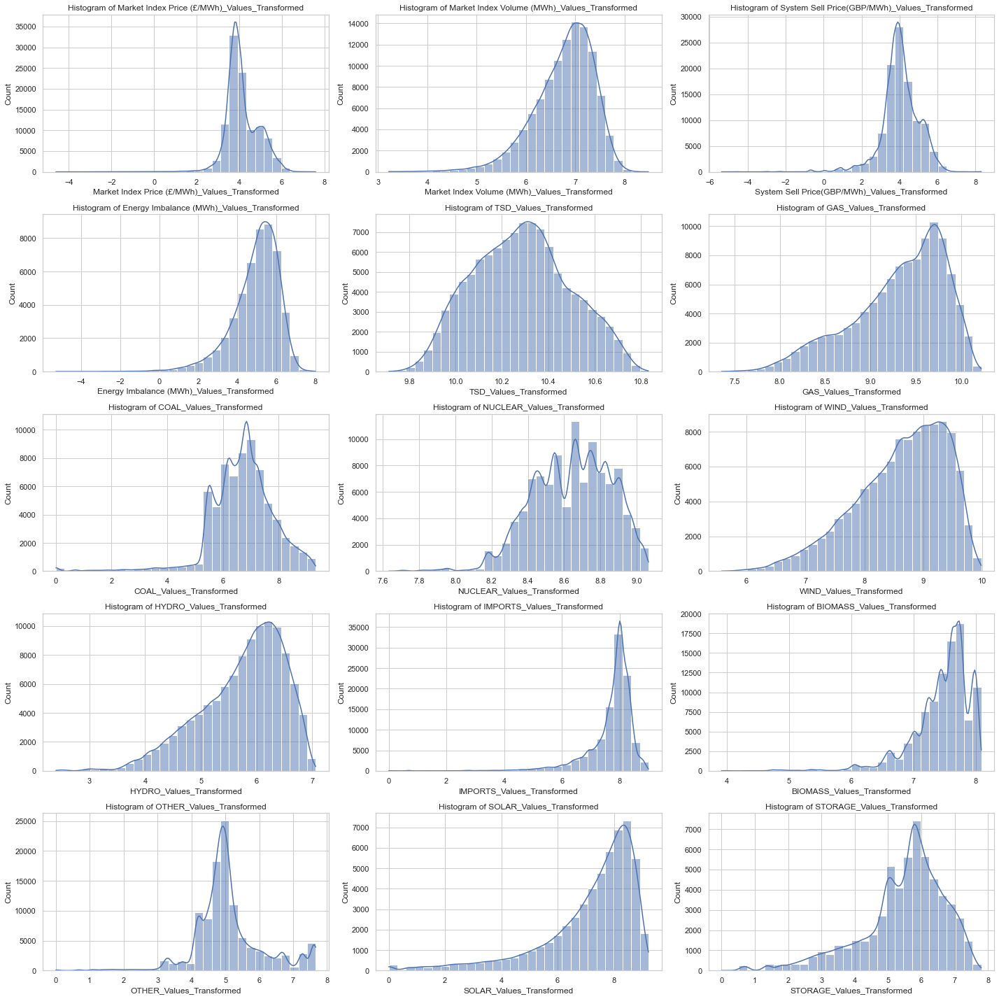

In [61]:
plot_histogram_for_all_columns(df1)

In [149]:
data;

# Seasonality Trends

In [ ]:
'DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)',
       'Market Index Price (£/MWh)_Values_Transformed',
       'Market Index Volume (MWh)_Values_Transformed',
       'System Sell Price(GBP/MWh)_Values_Transformed',
       'Energy Imbalance (MWh)_Values_Transformed'

In [ ]:
'EMBEDDED_WIND_GENERATION',
       'EMBEDDED_SOLAR_GENERATION', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'

In [151]:
COL = ['TSD', 
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)']

In [155]:
col = ['EMBEDDED_WIND_GENERATION',
       'EMBEDDED_SOLAR_GENERATION','GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO']

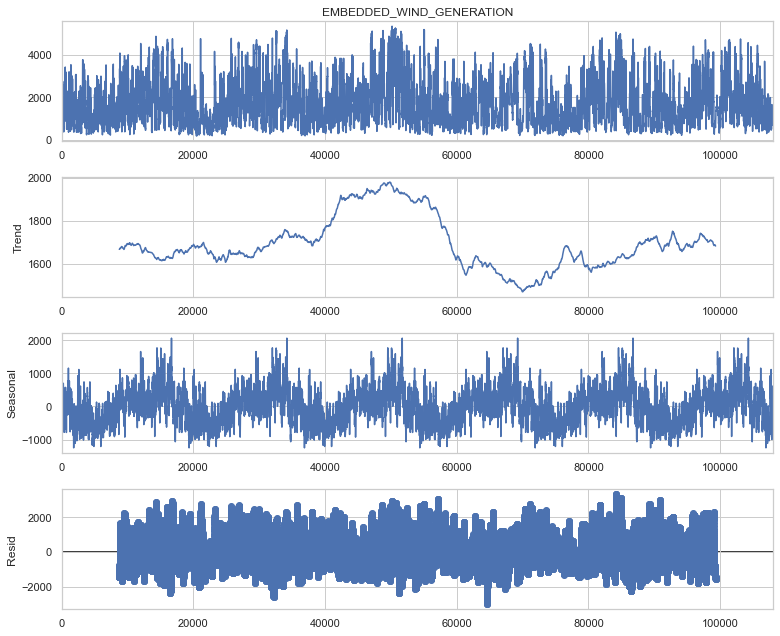

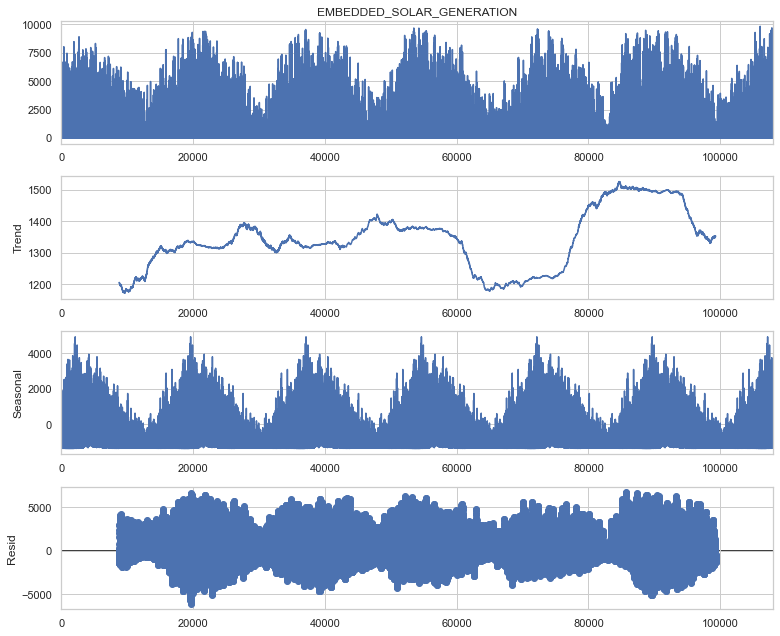

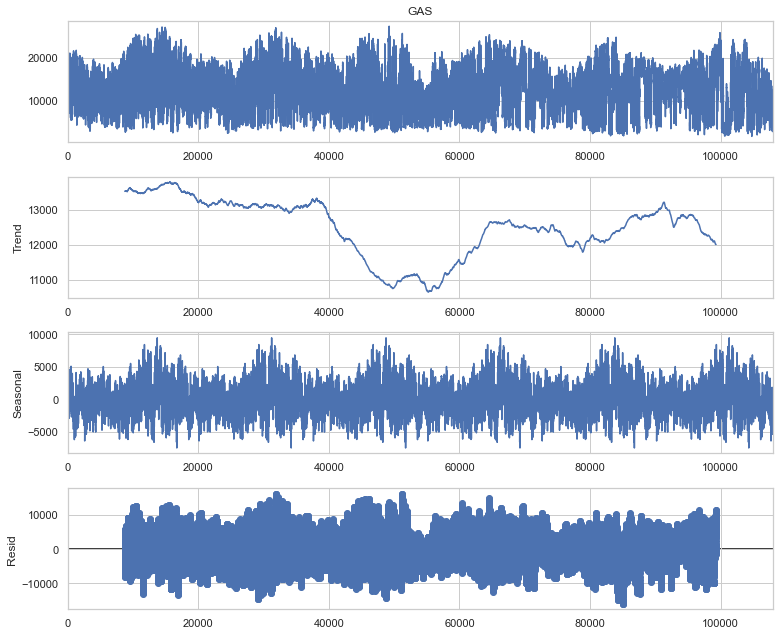

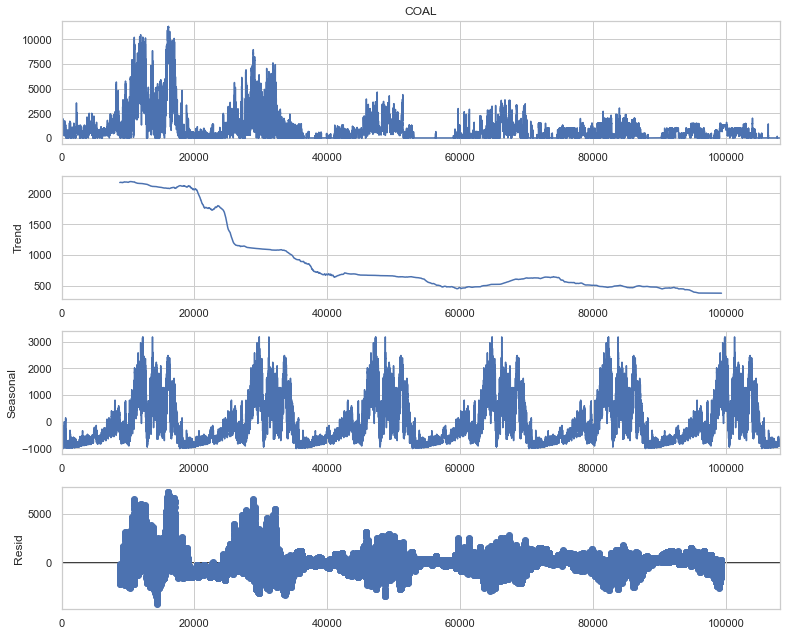

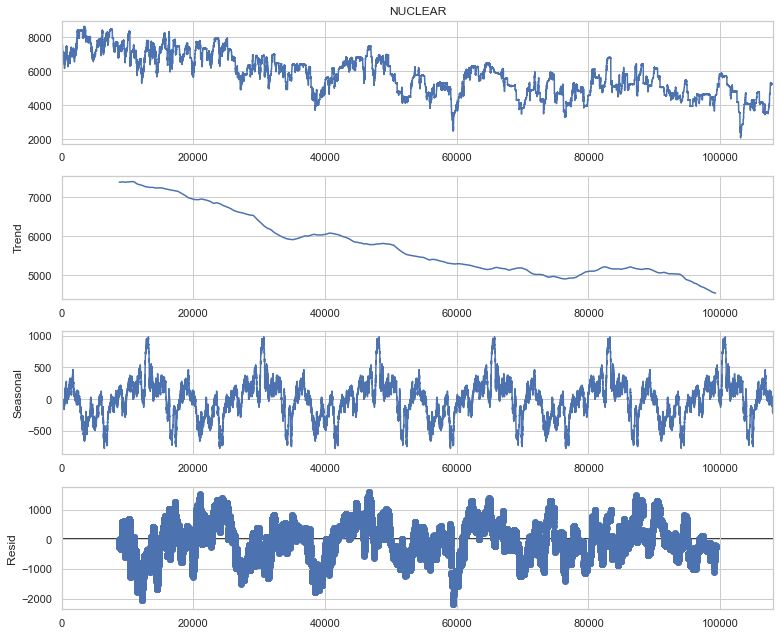

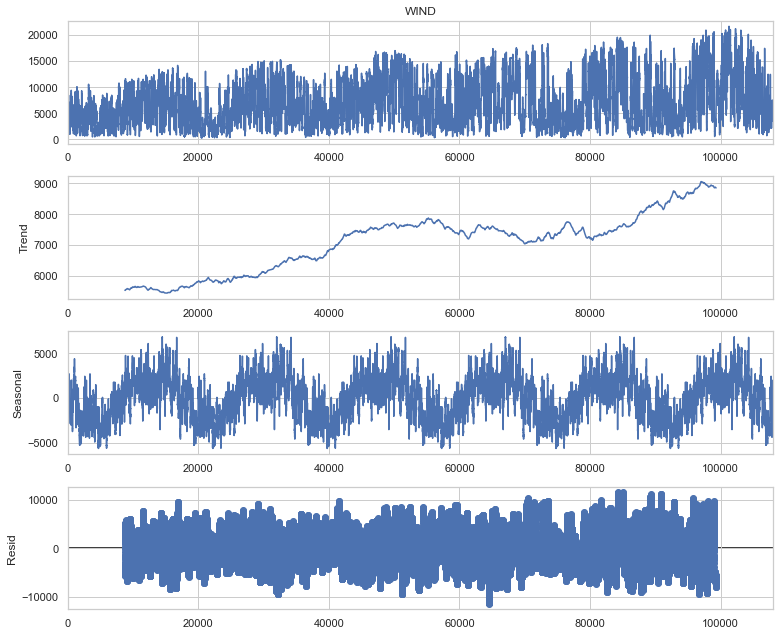

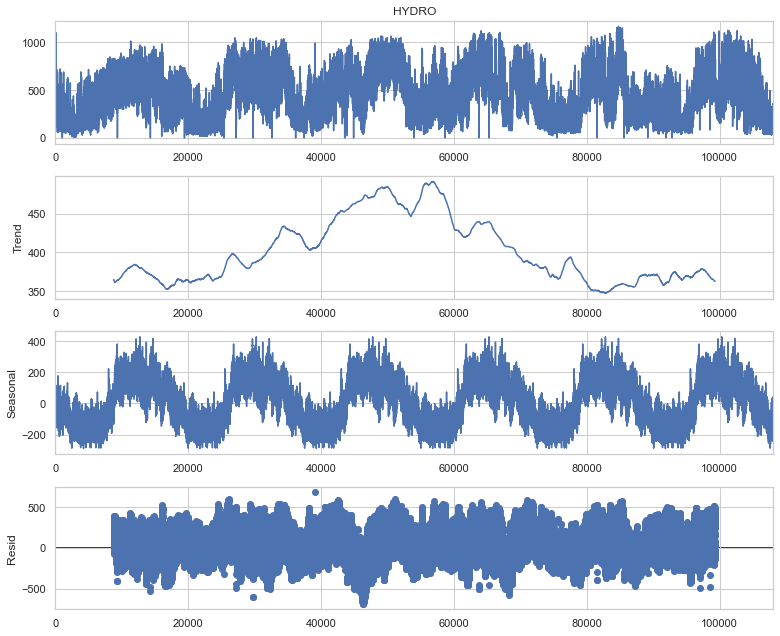

In [156]:
import statsmodels.api as sm
plt.rcParams['figure.figsize'] = 11, 9
for i in col:
    decomposed = sm.tsa.seasonal_decompose(data[i],period=17520) # The frequncy is annual
    figure = decomposed.plot()
    plt.show()

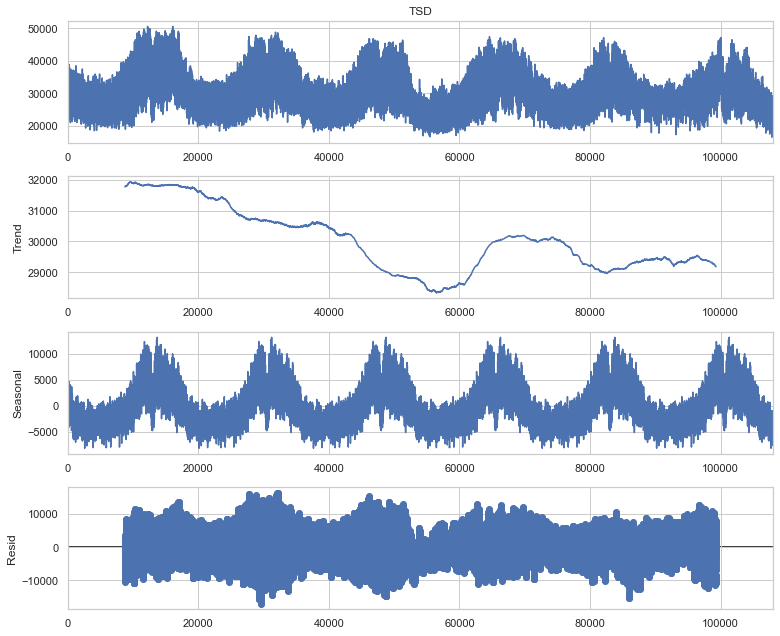

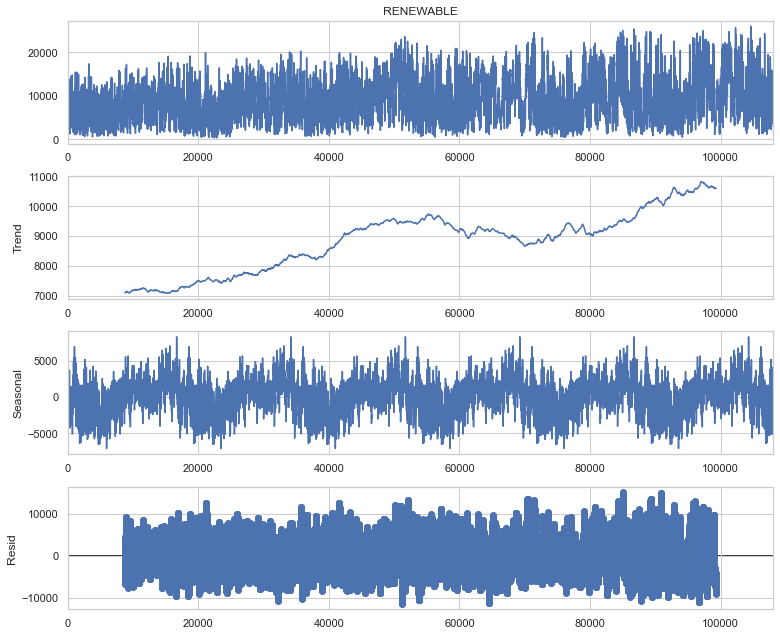

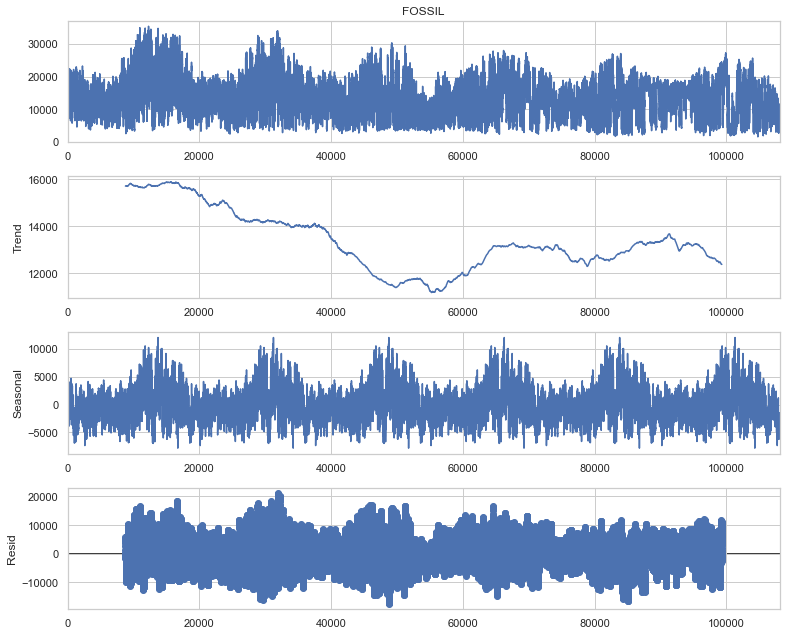

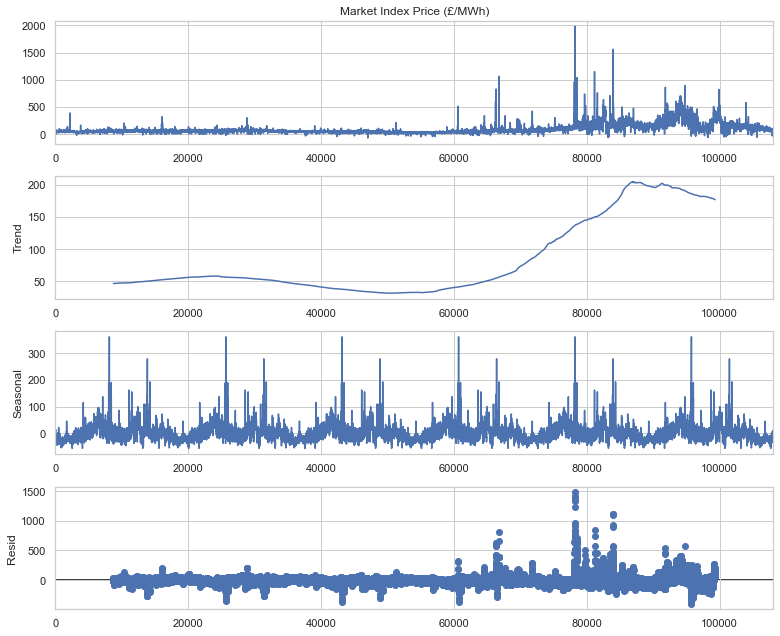

In [154]:
import statsmodels.api as sm
plt.rcParams['figure.figsize'] = 11, 9
for i in COL:
    decomposed = sm.tsa.seasonal_decompose(data[i],period=17520) # The frequncy is annual
    figure = decomposed.plot()
    plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm

# Load your time series data (replace with your data source)
#data = pd.read_csv('your_time_series_data.csv')
data['DATETIME'] = pd.to_datetime(data['DATETIME'])
data.set_index('DATETIME', inplace=True)

# Resample the data to a frequency that highlights the seasonality (e.g., monthly)
monthly_data = data['Market Index Price (£/MWh)'].resample('M').mean()

# Decompose the time series to isolate its components
result = sm.tsa.seasonal_decompose(monthly_data, model='additive')

# Plot the original data, trend, seasonal, and residual components
plt.figure(figsize=(10, 8))
plt.subplot(4, 1, 1)
plt.plot(monthly_data, label='Original Data')
plt.legend(loc='upper left')
plt.subplot(4, 1, 2)
plt.plot(result.trend, label='Trend')
plt.legend(loc='upper left')
plt.subplot(4, 1, 3)
plt.plot(result.seasonal, label='Seasonal')
plt.legend(loc='upper left')
plt.subplot(4, 1, 4)
plt.plot(result.resid, label='Residuals')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()


# Line Plots

In [151]:
import pandas as pd
import matplotlib.pyplot as plt

def line_plot_all_sources(data, datetime_col, sources, figsize=(12, 6)):
    """
    Create a line plot for all sources in one graph against datetime.

    Parameters:
        - data (pandas DataFrame): The data containing the datetime and source columns.
        - datetime_col (str): The name of the column representing the datetime.
        - sources (list): List of column names for the sources to plot.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (12, 6).

    Returns:
        None (displays the plot).
    """
    # Set seaborn style
    plt.style.use('seaborn')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Loop through each source and plot the line
    for source in sources:
        plt.plot(data[datetime_col], data[source], label=source)

    # Set plot title, axis labels, and legend
    plt.title('Line Plot of All Sources')
    plt.xlabel('Datetime')
    plt.ylabel('Values')
    plt.legend()

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)

    # Display the plot
    plt.show()


/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_99114/3662911877.py:18: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


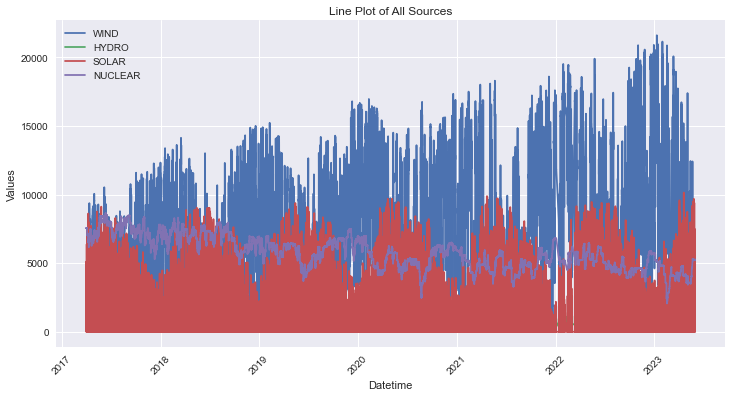

In [152]:
# Assuming you have a DataFrame called 'df'
# List of column names for the sources to plot
sources_to_plot = ['WIND', 'HYDRO', 'SOLAR','NUCLEAR']  # Replace with the actual column names

# Call the function to plot all sources in one graph
line_plot_all_sources(df, 'DATETIME', sources_to_plot)


In [21]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [114]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def line_plot_all_sources(data, datetime_col, sources, figsize=(12, 6)):
    """
    Create a line plot for all sources in one graph against datetime using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the datetime and source columns.
        - datetime_col (str): The name of the column representing the datetime.
        - sources (list): List of column names for the sources to plot.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (12, 6).

    Returns:
        None (displays the plot).
    """
    # Convert the DataFrame to long-form using pandas melt function
    data_long = pd.melt(data, id_vars=datetime_col, value_vars=sources, var_name='Source', value_name='Values')
    
    data_long[datetime_col] = pd.to_datetime(data_long[datetime_col])

    # Extract the years from the datetime column
    data_long['Year'] = data_long[datetime_col].dt.year

    # Set seaborn style
    sns.set_theme(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the line plot using Seaborn
    sns.lineplot(x='Year', y='Values', hue='Source', data=data_long)

    # Set plot title, axis labels, and legend
    plt.title('Line Plot of Comparison Sources')
    plt.xlabel('Year')
    plt.ylabel('Values')

    # Display the plot
    plt.show()


In [117]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def line_plot_all_sources_monthly(data, datetime_col, sources, figsize=(12, 6)):
    """
    Create a line plot for all sources in one graph against datetime using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the datetime and source columns.
        - datetime_col (str): The name of the column representing the datetime.
        - sources (list): List of column names for the sources to plot.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (12, 6).

    Returns:
        None (displays the plot).
    """
    # Convert the DataFrame to long-form using pandas melt function
    data_long = pd.melt(data, id_vars=datetime_col, value_vars=sources, var_name='Source', value_name='Values')
    
    data_long[datetime_col] = pd.to_datetime(data_long[datetime_col])


    # Extract the years from the datetime column
    data_long['Year'] = data_long[datetime_col].dt.year
    data_long['Month'] = data_long[datetime_col].dt.month

    # Set seaborn style
    sns.set_theme(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the line plot using Seaborn
    sns.lineplot(x='DATETIME', y='Values', hue='Source', data=data_long)

    # Set plot title, axis labels, and legend
    plt.title('Line Plot of Non Renwable Sources')
    plt.xlabel('Year')
    plt.ylabel('Values')

    # Display the plot
    plt.show()


In [118]:
SS = ['EMBEDDED_WIND_GENERATION',
       'EMBEDDED_SOLAR_GENERATION','HYDRO','BIOMASS']

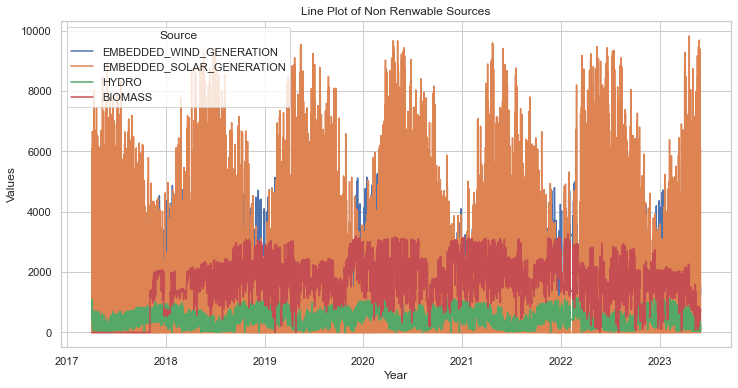

In [119]:
line_plot_all_sources_monthly(df, 'DATETIME', SS, figsize=(12, 6))

In [112]:
df.columns


Index(['Unnamed: 0', 'DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [19]:
sources = [
       'EMBEDDED_WIND_GENERATION',
       'EMBEDDED_SOLAR_GENERATION',
        'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
        'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']

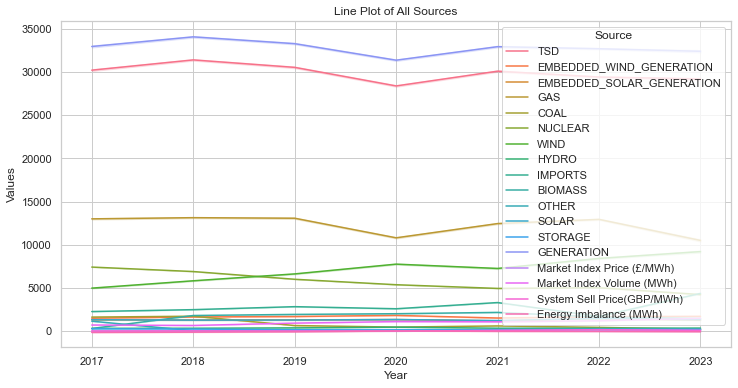

In [104]:
line_plot_all_sources(df, 'DATETIME', sources, figsize=(12, 6))



In [113]:
srs = ['RENEWABLE', 'FOSSIL' ]



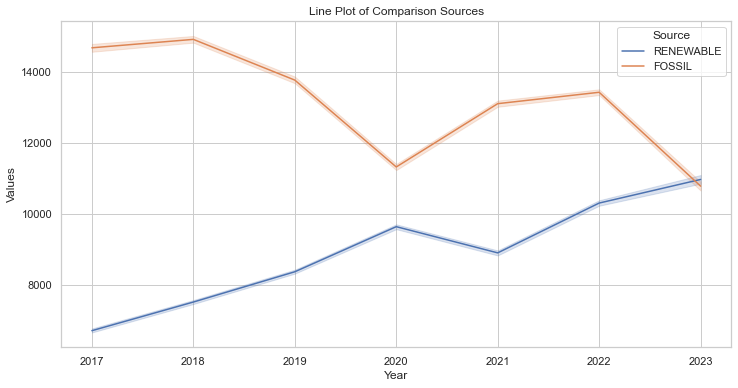

In [116]:
line_plot_all_sources(df, 'DATETIME', srs,figsize=(12, 6))



In [244]:
srs = ['GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR']

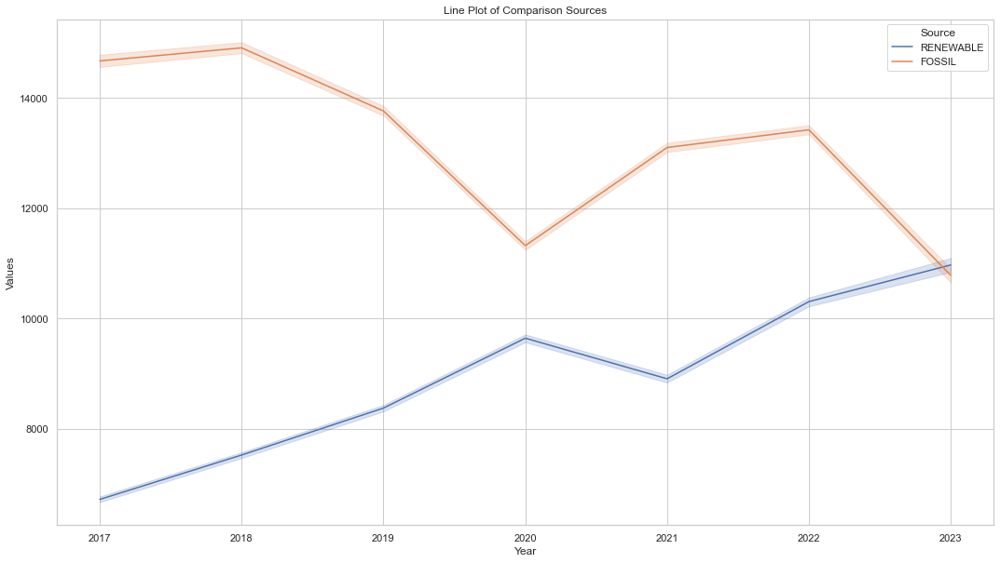

In [115]:
line_plot_all_sources(df, 'DATETIME', srs, figsize=(18, 10))




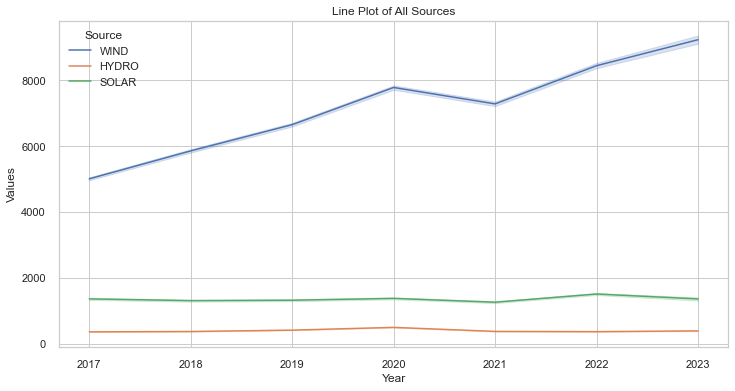

In [144]:
# Assuming you have a DataFrame called 'df'
# List of column names for the sources to plot
#sources_to_plot = ['source1', 'source2', 'source3']  # Replace with the actual column names

# Call the function to plot all sources in one graph with years on the x-axis
line_plot_all_sources(df, 'DATETIME', sources_to_plot)


In [250]:
data_long

,DATETIME,Source,Values,GAS_MA,COAL_MA,NUCLEAR_MA,WIND_MA,HYDRO_MA
0,2017-04-01 00:00:00,GAS,8940.0,8940.000000,8940.000000,8940.000000,8940.000000,8940.000000
1,2017-04-01 00:30:00,GAS,9269.0,9104.500000,9104.500000,9104.500000,9104.500000,9104.500000
2,2017-04-01 01:00:00,GAS,9297.0,9168.666667,9168.666667,9168.666667,9168.666667,9168.666667
3,2017-04-01 01:30:00,GAS,9148.0,9163.500000,9163.500000,9163.500000,9163.500000,9163.500000
4,2017-04-01 02:00:00,GAS,8998.0,9130.400000,9130.400000,9130.400000,9130.400000,9130.400000
...,...,...,...,...,...,...,...,...
540345,2023-05-31 21:30:00,HYDRO,98.0,122.933333,122.933333,122.933333,122.933333,122.933333
540346,2023-05-31 22:00:00,HYDRO,92.0,119.433333,119.433333,119.433333,119.433333,119.433333
540347,2023-05-31 22:30:00,HYDRO,92.0,117.300000,117.300000,117.300000,117.300000,117.300000
540348,2023-05-31 23:00:00,HYDRO,92.0,116.166667,116.166667,116.166667,116.166667,116.166667


In [258]:
df.iloc[:,1:]

,ND,TSD,ENGLAND_WALES_DEMAND,EMBEDDED_WIND_GENERATION,EMBEDDED_WIND_CAPACITY,EMBEDDED_SOLAR_GENERATION,EMBEDDED_SOLAR_CAPACITY,PUMP_STORAGE_PUMPING,GAS,COAL,...,OTHER,SOLAR,STORAGE,GENERATION,RENEWABLE,FOSSIL,Market Index Price (£/MWh),Market Index Volume (MWh),System Sell Price(GBP/MWh),Energy Imbalance (MWh)
0,23874,24937,21784,1159,4831,0,11750,526,8940.0,575.0,...,2070.0,0.0,0.0,26093.0,4024.0,9515.0,24.27,126.05,22.00950,-572.883
1,23137,24507,21095,1114,4831,0,11750,870,9269.0,639.0,...,2069.0,0.0,0.0,26469.0,3891.0,9908.0,25.11,309.60,22.15351,-559.190
2,23168,24751,21188,1070,4831,0,11750,1040,9297.0,679.0,...,2085.0,0.0,0.0,26675.0,3817.0,9976.0,29.81,461.15,28.75000,-141.802
3,23548,25148,21607,1027,4831,0,11750,1100,9148.0,644.0,...,2088.0,0.0,0.0,26421.0,3667.0,9792.0,30.30,422.00,50.50000,40.125
4,23209,25404,21309,966,4831,0,11750,1695,8998.0,581.0,...,2090.0,0.0,0.0,26106.0,3587.0,9579.0,30.44,528.65,50.98269,139.325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108065,25826,27226,23515,1353,6538,0,13081,6,8551.0,0.0,...,144.0,0.0,28.0,25294.0,6734.0,8551.0,86.16,1442.90,31.00000,-44.620
108066,24836,26248,22570,1348,6538,0,13081,6,7712.0,0.0,...,115.0,0.0,0.0,24235.0,6594.0,7712.0,89.27,1382.15,30.55000,181.377
108067,23744,25226,21589,1342,6538,0,13081,5,7757.0,0.0,...,116.0,0.0,0.0,23251.0,6406.0,7757.0,74.86,1514.10,0.00000,-135.464
108068,22483,23965,20392,1301,6538,0,13081,5,7448.0,0.0,...,122.0,0.0,0.0,22780.0,6256.0,7448.0,60.89,1029.90,0.00000,3.081


In [259]:
df.iloc[:,1:].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108070 entries, 0 to 108069
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   ND                          108070 non-null  int64  
 1   TSD                         108070 non-null  int64  
 2   ENGLAND_WALES_DEMAND        108070 non-null  int64  
 3   EMBEDDED_WIND_GENERATION    108070 non-null  int64  
 4   EMBEDDED_WIND_CAPACITY      108070 non-null  int64  
 5   EMBEDDED_SOLAR_GENERATION   108070 non-null  int64  
 6   EMBEDDED_SOLAR_CAPACITY     108070 non-null  int64  
 7   PUMP_STORAGE_PUMPING        108070 non-null  int64  
 8   GAS                         108070 non-null  float64
 9   COAL                        108070 non-null  float64
 10  NUCLEAR                     108070 non-null  float64
 11  WIND                        108070 non-null  float64
 12  HYDRO                       108070 non-null  float64
 13  IMPORTS       

In [130]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def line_plot_with_moving_average(data, datetime_col, sources, window=7, figsize=(12, 6)):
    """
    Create a line plot with moving average for all sources against datetime using Seaborn.

    Parameters:
        - data (pandas DataFrame): The data containing the datetime and source columns.
        - datetime_col (str): The name of the column representing the datetime.
        - sources (list): List of column names for the sources to plot.
        - window (int, optional): The window size for calculating the moving average. Default is 7.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (12, 6).

    Returns:
        None (displays the plot).
    """
    # Convert the DataFrame to long-form using pandas melt function
    data_long = pd.melt(data, id_vars=datetime_col, value_vars=sources, var_name='Source', value_name='Values')

    # Calculate the moving average for each source
    for source in sources:
        data_long[f'{source}_MA'] = data_long[source].rolling(window=window, min_periods=1).mean()

    # Set seaborn style
    sns.set_theme(style='whitegrid')

    # Create a figure with the specified figsize
    plt.figure(figsize=figsize)

    # Create the line plot for each source
    for source in sources:
        plt.plot(data_long[datetime_col], data_long[f'{source}_MA'], label=f'{source} (MA)')

    # Set plot title, axis labels, and legend
    plt.title('Line Plot with Moving Average for All Sources')
    plt.xlabel('Datetime')
    plt.ylabel('Values')
    plt.legend()

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)

    # Display the plot
    plt.show()


In [264]:
df.columns

Index(['DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

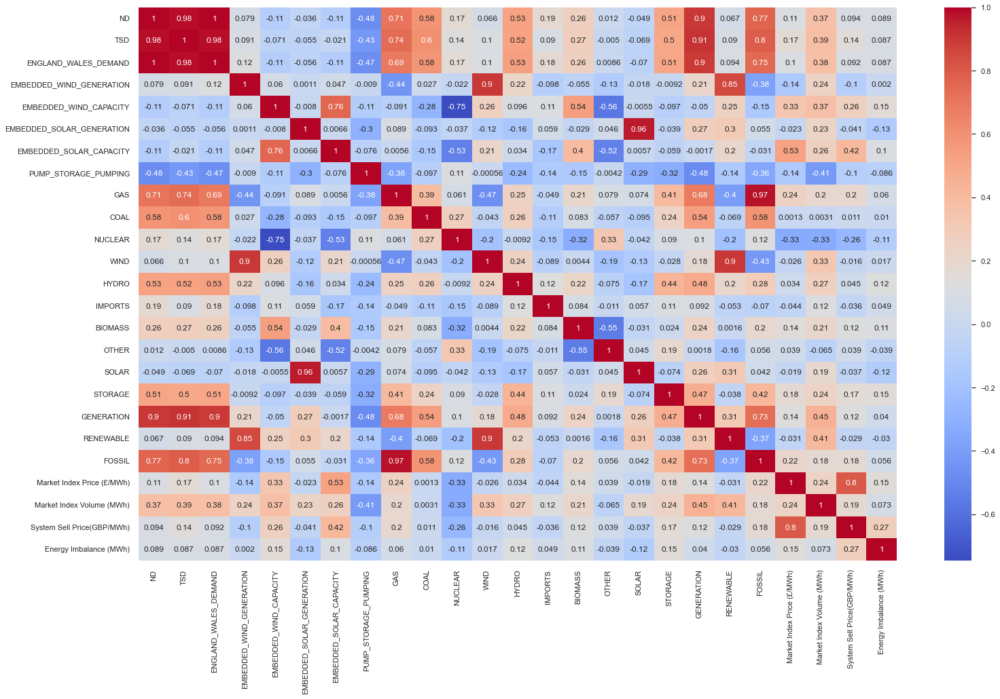

In [273]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm')
plt.show()

In [5]:
correlation_matrix = df.corr()

In [12]:
# Set the correlation threshold above which columns will be considered highly correlated
correlation_threshold = 0.7

# Find the highly correlated columns
highly_correlated_cols = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
            col_i = correlation_matrix.columns[i]
            col_j = correlation_matrix.columns[j]
            if col_i != col_j:
                if col_i in df.columns and col_j in df.columns:
                    # Add the column with higher correlation with the target variable
                    # You can change the selection criterion as per your requirement
                    target_column = 'Market Index Price (£/MWh)'
                    corr_i = abs(df[target_column].corr(df[col_i]))
                    corr_j = abs(df[target_column].corr(df[col_j]))

                    if corr_i > corr_j:
                        highly_correlated_cols.add(col_j)
                    else:
                        highly_correlated_cols.add(col_i)

# Remove the highly correlated columns from the DataFrame
#df_filtered = df.drop(columns=highly_correlated_cols)

# Now 'df_filtered' contains the original DataFrame with highly correlated columns removed
highly_correlated_cols

{'EMBEDDED_SOLAR_CAPACITY',
 'EMBEDDED_WIND_CAPACITY',
 'ENGLAND_WALES_DEMAND',
 'FOSSIL',
 'GENERATION',
 'ND',
 'NUCLEAR',
 'RENEWABLE',
 'SOLAR',
 'System Sell Price(GBP/MWh)',
 'TSD',
 'WIND'}

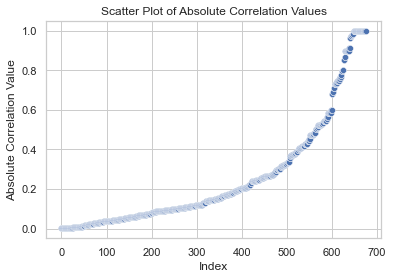

In [8]:
import pandas as pd
import numpy as np


# Extract the absolute correlation values from the correlation matrix
abs_corr_values = correlation_matrix.abs().values



flat_abs = abs_corr_values.flatten()
flat_abs_sort = np.sort(abs_corr_values)

pq1 = pd.DataFrame({'Index': range(len(flat_abs)), 'Values': np.sort(flat_abs)})
#pd.DataFrame({'Index': range(len(corrval_1)), 'Values': corrval_1})


# Extract the 'Index' and 'Values' columns from the DataFrame
indices = pq1['Index']
valuesCorr = pq1['Values']

# Create a list of tuples containing the (index, value) pairs
lpq1 = list(zip(range(len(flat_abs)), np.sort(flat_abs)))

# Remove the first value (index 0) from the list
#lpq1 = lpq1[1:]

# Convert the list of tuples to a DataFrame
lpq1_df = pd.DataFrame(lpq1, columns=['Index', 'Values'])

# Set seaborn style
sns.set(style='whitegrid')

# Create the scatter plot
sns.scatterplot(data=lpq1_df, x='Index', y='Values')

# Set plot title and axis labels
plt.title('Scatter Plot of Absolute Correlation Values')
plt.xlabel('Index')
plt.ylabel('Absolute Correlation Value')

# Display the plot
plt.show()



In [25]:
data_set = ['DATETIME',  'TSD',
       'EMBEDDED_WIND_GENERATION', 
       'EMBEDDED_SOLAR_GENERATION', 'HYDRO',
        'BIOMASS',  'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']

In [26]:
df_1= df[data_set]

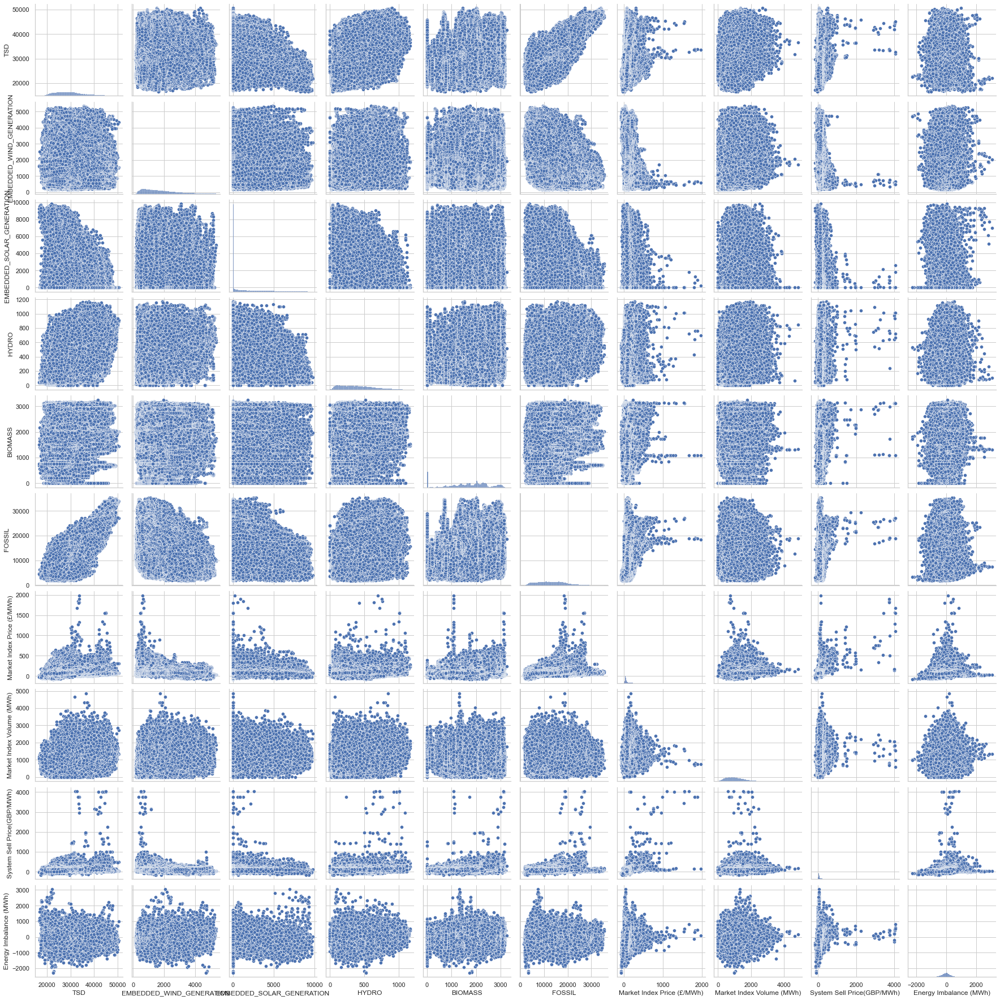

In [27]:
sns.pairplot(df_1)

In [275]:
srss = ['EMBEDDED_SOLAR_GENERATION','SOLAR']

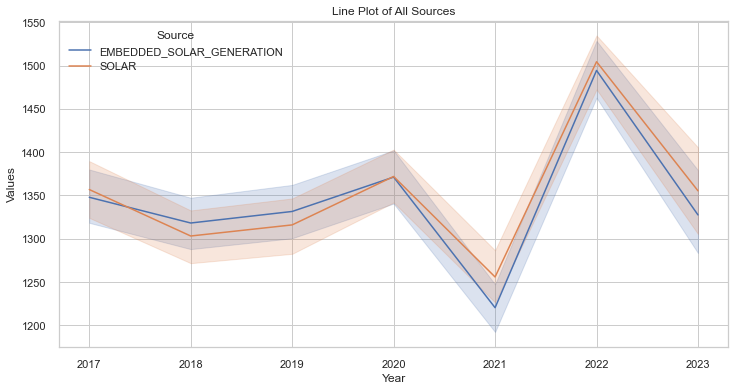

In [276]:
line_plot_all_sources(df,'DATETIME',srss)

In [277]:
srsw = ['EMBEDDED_WIND_GENERATION','WIND']

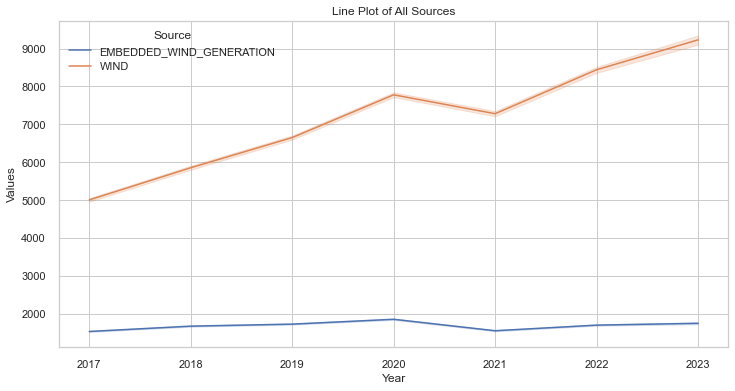

In [278]:
line_plot_all_sources(df,'DATETIME',srsw)

In [52]:
final =  ['DATETIME', 'TSD','GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO','SOLAR',
       'IMPORTS', 'BIOMASS', 'OTHER', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)']

In [53]:
df_final = df[final]

In [274]:
import scikit_learn_data 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as datetime 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [ ]:
df_final

In [286]:
import pandas as pd

def cross_correlation_all_columns(data):
    """
    Calculate the cross-correlation for all numeric columns in the DataFrame.

    Parameters:
        - data (pandas DataFrame): The DataFrame containing the columns to calculate cross-correlation.

    Returns:
        - cross_corr_df (pandas DataFrame): A DataFrame containing the cross-correlation values between all numeric columns.
    """
    # Filter out non-numeric columns
    numeric_columns = data.select_dtypes(include=[np.number])

    # Calculate the correlation matrix for numeric columns
    correlation_matrix = numeric_columns.corr()

    # Create an empty DataFrame to store the cross-correlation values
    cross_corr_df = pd.DataFrame(index=numeric_columns.columns, columns=numeric_columns.columns)

    # Loop through each numeric column and calculate the cross-correlation with other columns
    for col in numeric_columns.columns:
        cross_corr = numeric_columns.corrwith(numeric_columns[col])
        cross_corr_df[col] = cross_corr

    return cross_corr_df


cross_corr_df = cross_correlation_all_columns(df_final)
cross_corr_df

,TSD,GAS,COAL,NUCLEAR,WIND,HYDRO,SOLAR,IMPORTS,BIOMASS,OTHER,Market Index Price (£/MWh),Market Index Volume (MWh),System Sell Price(GBP/MWh),Energy Imbalance (MWh)
TSD,1.000000,0.737426,0.601646,0.136777,0.099825,0.523210,-0.068704,0.090411,0.270221,-0.005046,0.168234,0.385756,0.144642,0.086965
GAS,0.737426,1.000000,0.388076,0.061105,-0.471349,0.250330,0.074230,-0.048543,0.205402,0.079347,0.244432,0.198216,0.198984,0.060407
COAL,0.601646,0.388076,1.000000,0.267930,-0.042754,0.264062,-0.095119,-0.111316,0.083154,-0.056620,0.001319,0.003114,0.011094,0.010089
NUCLEAR,0.136777,0.061105,0.267930,1.000000,-0.195354,-0.009158,-0.041554,-0.153556,-0.323090,0.325776,-0.331414,-0.334026,-0.256898,-0.114581
WIND,0.099825,-0.471349,-0.042754,-0.195354,1.000000,0.242939,-0.129559,-0.089468,0.004412,-0.188475,-0.025718,0.325032,-0.015813,0.017114
HYDRO,0.523210,0.250330,0.264062,-0.009158,0.242939,1.000000,-0.174122,0.120471,0.222379,-0.075380,0.033856,0.268970,0.044918,0.120416
SOLAR,-0.068704,0.074230,-0.095119,-0.041554,-0.129559,-0.174122,1.000000,0.056608,-0.031047,0.044589,-0.019145,0.194433,-0.036796,-0.117212
IMPORTS,0.090411,-0.048543,-0.111316,-0.153556,-0.089468,0.120471,0.056608,1.000000,0.084130,-0.010722,-0.044216,0.117274,-0.035901,0.049288
BIOMASS,0.270221,0.205402,0.083154,-0.323090,0.004412,0.222379,-0.031047,0.084130,1.000000,-0.554140,0.144717,0.205222,0.115045,0.112515
OTHER,-0.005046,0.079347,-0.056620,0.325776,-0.188475,-0.075380,0.044589,-0.010722,-0.554140,1.000000,0.038574,-0.064960,0.038562,-0.039298


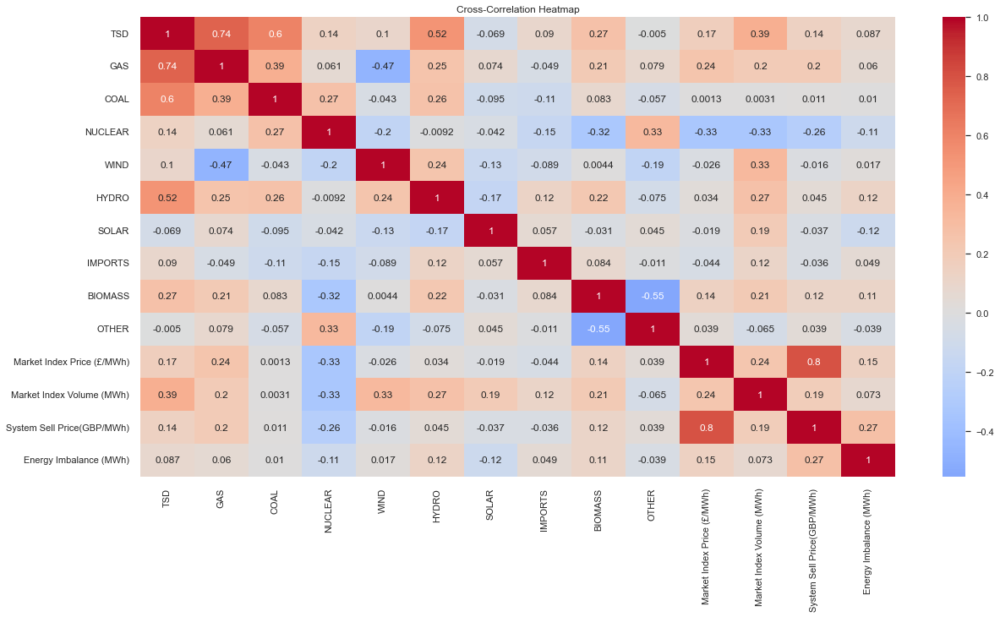

In [288]:
plt.figure(figsize=(20, 10))
sns.heatmap(cross_corr_df, annot=True, cmap='coolwarm', center=0)
plt.title('Cross-Correlation Heatmap')
plt.show()

In [50]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

def plot_acf_for_columns(data, column_names, x,ncols=3, figsize=(15, 10)):
    """
    Plot the ACF (AutoCorrelation Function) for multiple columns in the DataFrame.

    Parameters:
        - data (pandas DataFrame): The DataFrame containing the time series data.
        - column_names (list): List of column names for which to calculate and plot the ACF.
        - ncols (int, optional): Number of columns for subplots. Default is 3.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 10).

    Returns:
        None (displays the plot).
    """

    # Calculate the number of rows required for subplots
    nrows = len(column_names) // ncols
    if len(column_names) % ncols != 0:
        nrows += 1

    # Create subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

    # Flatten axes for easier iteration
    axes = axes.flatten()

    # Loop through the column names and plot ACFs
    for i, column in enumerate(column_names):
        # Calculate the ACF for the current column
        acf_values = acf(data[column], nlags=x)

        # Plot the ACF values in the corresponding subplot
        axes[i].stem(acf_values)
        axes[i].set_title(f'ACF for {column}')
        axes[i].set_xlabel('Lag')
        axes[i].set_ylabel('Autocorrelation')

    # Remove any empty subplots
    for i in range(len(column_names), nrows*ncols):
        fig.delaxes(axes[i])

    # Adjust layout and spacing
    plt.tight_layout()

    # Display the plot
    plt.show()

In [36]:
sc2 = df_f.columns

NameError: name 'df_f' is not defined

In [60]:
df_f =  df_final.set_index('DATETIME')

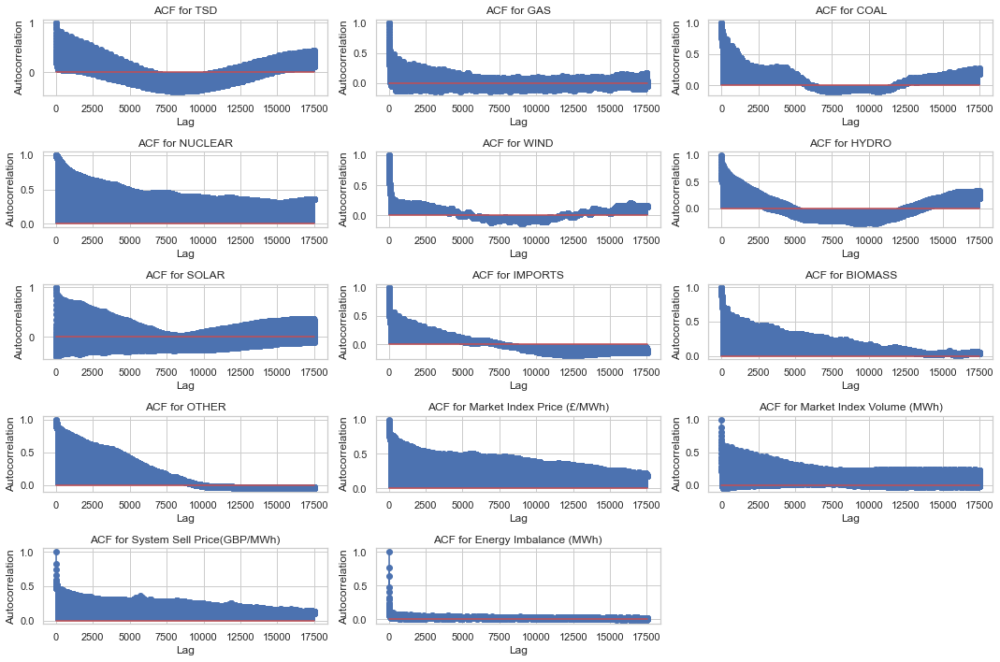

In [62]:
plot_acf_for_columns(df_f,sc2,17520)

In [63]:
df_f.columns

Index(['TSD', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO', 'SOLAR', 'IMPORTS',
       'BIOMASS', 'OTHER', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

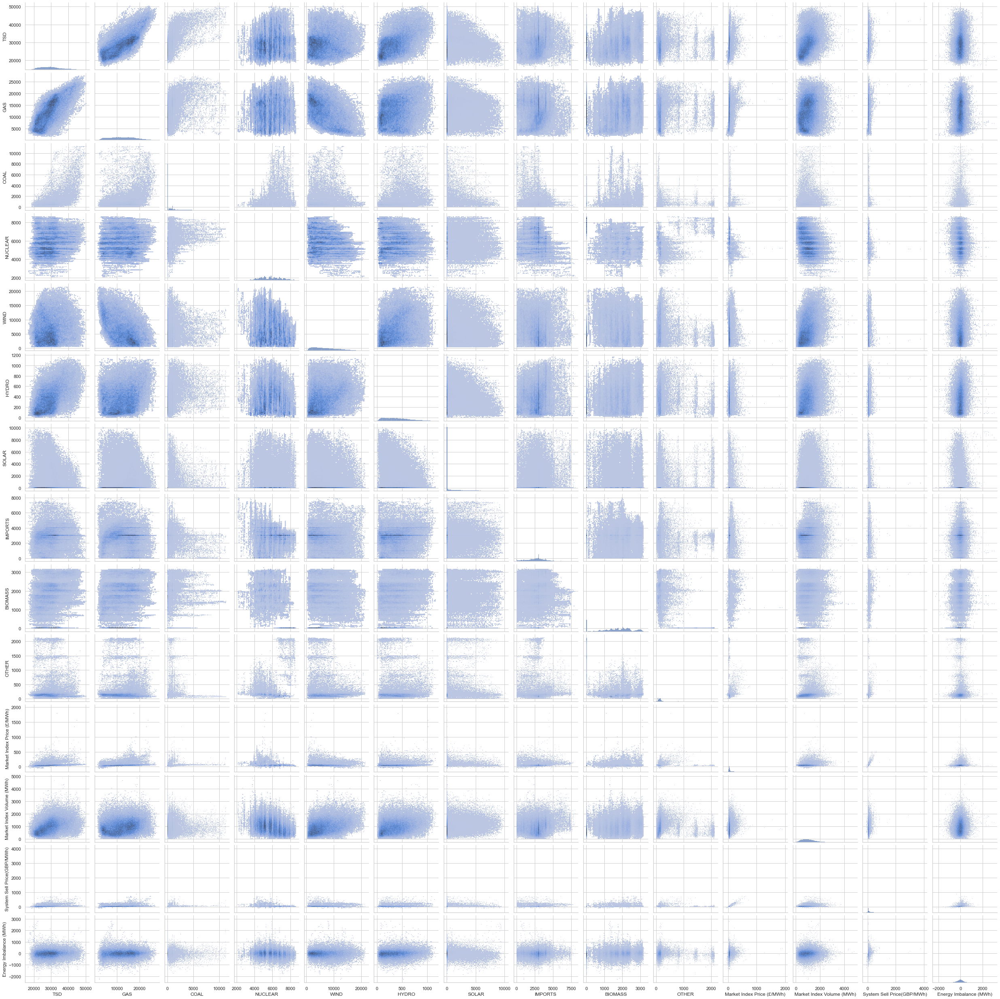

In [67]:
sns.pairplot(df_f,kind = 'hist')
plt.show()

In [29]:
def plot_acf_for_columns(data, column_names, x,ncols=3, figsize=(15, 10)):
    """
    Plot the ACF (AutoCorrelation Function) for multiple columns in the DataFrame.

    Parameters:
        - data (pandas DataFrame): The DataFrame containing the time series data.
        - column_names (list): List of column names for which to calculate and plot the ACF.
        - ncols (int, optional): Number of columns for subplots. Default is 3.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 10).

    Returns:
        None (displays the plot).
    """

    # Calculate the number of rows required for subplots
    nrows = len(column_names) // ncols
    if len(column_names) % ncols != 0:
        nrows += 1

    # Create subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

    # Flatten axes for easier iteration
    axes = axes.flatten()

    # Loop through the column names and plot ACFs
    for i, column in enumerate(column_names):
        # Calculate the ACF for the current column
        acf_values = acf(data[column], nlags=x)

        # Plot the ACF values in the corresponding subplot
        axes[i].stem(acf_values)
        axes[i].set_title(f'ACF for {column}')
        axes[i].set_xlabel('Lag')
        axes[i].set_ylabel('Autocorrelation')

    # Remove any empty subplots
    for i in range(len(column_names), nrows*ncols):
        fig.delaxes(axes[i])

    # Adjust layout and spacing
    plt.tight_layout()

    # Display the plot
    plt.show()

/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_61705/935531660.py:26: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(x=column, y="Market Index Price (£/MWh)", data=df, ax=axes[i])
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_61705/935531660.py:26: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(x=column, y="Market Index Price (£/MWh)", data=df, ax=axes[i])
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_61705/935531660.py:26: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(x=column, y="Market Index Price (£/MWh)", data=df, ax=axes[i])
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_61705/935531660.py:26: UserWarning: Ignoring `ax`; jointplot is a figure-level function.
  sns.jointplot(x=column, y="Market Index Price (£/MWh)", data=df, ax=axes[i])
/var/folders/9g/vv71v1_j0v526k86ksyt9rv00000gn/T/ipykernel_61705/935531660.py:26: UserWarnin

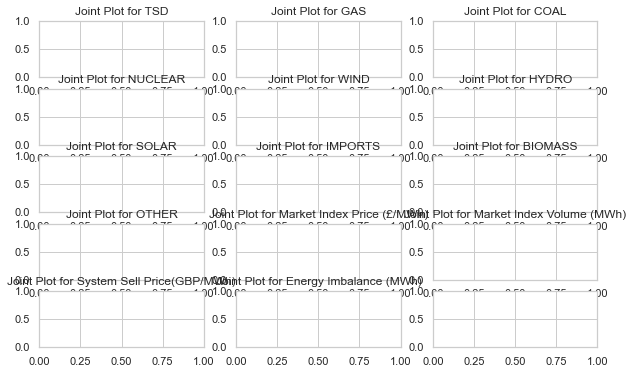

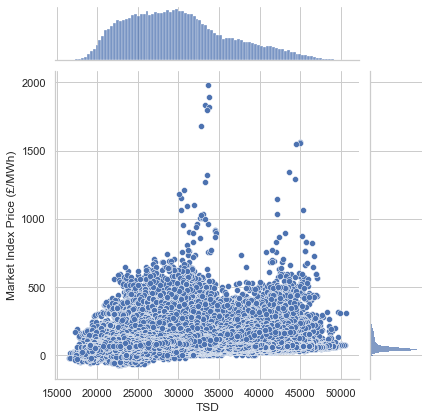

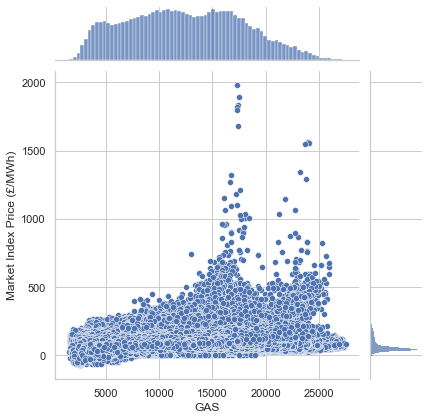

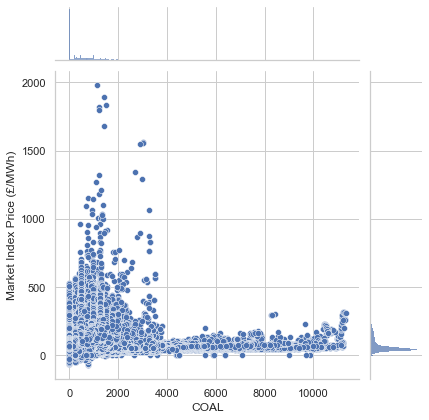

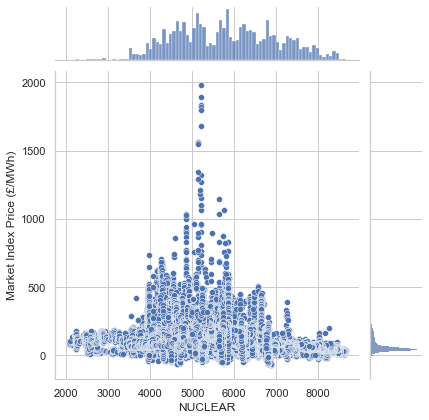

...

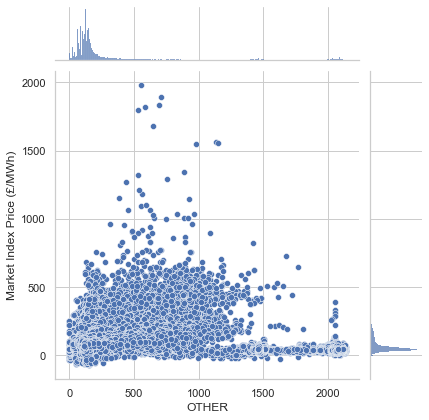

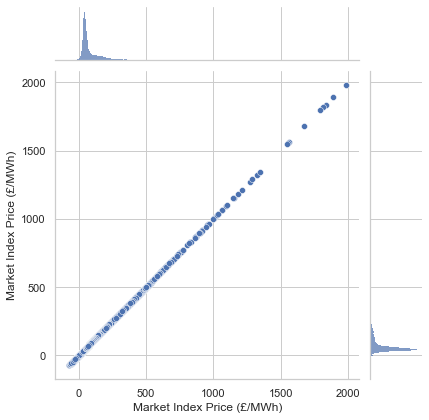

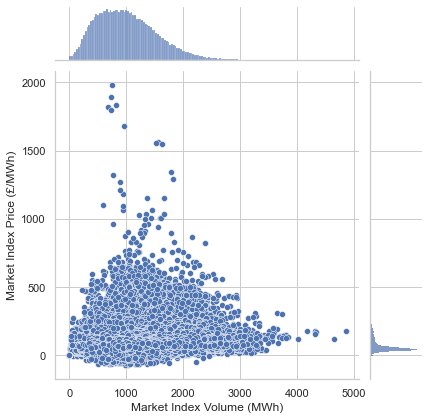

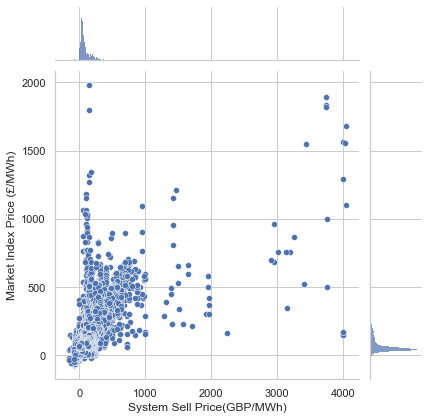

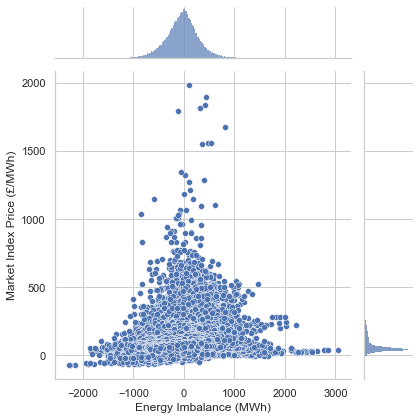

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a DataFrame (replace this with your actual data)
df = df_f
column_names = df.columns

# Calculate the number of rows and columns for subplots
num_rows = 5
num_cols = 3



nrows = len(column_names) // 3
if len(column_names) % 3 != 0:
    nrows += 1

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(10,6))

# Flatten axes for easier iteration
axes = axes.flatten()
    
# Loop through columns and create joint plots
for i, column in enumerate(column_names):
    sns.jointplot(x=column, y="Market Index Price (£/MWh)", data=df, ax=axes[i])
    axes[i].set_title(f'Joint Plot for {column}')

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


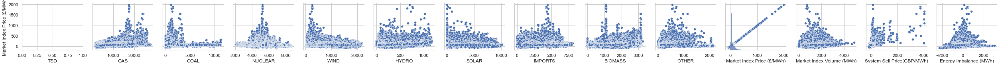

In [82]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a DataFrame (replace this with your actual data)
df = df_f
column_names = df.columns

# Create a PairGrid for the joint plots
g = sns.PairGrid(df, y_vars=["Market Index Price (£/MWh)"])
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot)

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


In [33]:
df_final = pd.read_csv('df_final')

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

def plot_acf_for_columns_line(data, column_names, x, ncols=3, figsize=(15, 10)):
    """
    Plot the ACF (AutoCorrelation Function) for multiple columns in the DataFrame.

    Parameters:
        - data (pandas DataFrame): The DataFrame containing the time series data.
        - column_names (list): List of column names for which to calculate and plot the ACF.
        - ncols (int, optional): Number of columns for subplots. Default is 3.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 10).

    Returns:
        None (displays the plot).
    """
    # Calculate the number of rows required for subplots
    nrows = len(column_names) // ncols
    if len(column_names) % ncols != 0:
        nrows += 1

    # Create subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

    # Flatten axes for easier iteration
    axes = axes.flatten()

    # Loop through the column names and plot ACFs
    for i, column in enumerate(column_names):
        # Calculate the ACF for the current column
        acf_values = acf(data[column], nlags=x)

        # Plot the ACF values in the corresponding subplot
        axes[i].plot(range(x+1), acf_values, marker='o', linestyle='-')
        axes[i].set_title(f'ACF for {column}')
        axes[i].set_xlabel('Lag')
        axes[i].set_ylabel('Autocorrelation')

    # Remove any empty subplots
    for i in range(len(column_names), nrows*ncols):
        fig.delaxes(axes[i])

    # Adjust layout and spacing
    plt.tight_layout()

    # Display the plot
    plt.show()


In [35]:
plot_acf_for_columns_line(df_final,sc2,17520,figsize=(40, 20))

NameError: name 'sc2' is not defined

In [311]:
len(df_final)//4

27017

In [316]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import pacf
from statsmodels.graphics.tsaplots import plot_pacf

def plot_pacf_for_columns(data, column_names, x, ncols=3, figsize=(15, 10)):
    """
    Plot the PACF (Partial AutoCorrelation Function) for multiple columns in the DataFrame.

    Parameters:
        - data (pandas DataFrame): The DataFrame containing the time series data.
        - column_names (list): List of column names for which to calculate and plot the PACF.
        - ncols (int, optional): Number of columns for subplots. Default is 3.
        - figsize (tuple, optional): Figure size in inches (width, height). Default is (15, 10).

    Returns:
        None (displays the plot).
    """
    # Calculate the number of rows required for subplots
    nrows = len(column_names) // ncols
    if len(column_names) % ncols != 0:
        nrows += 1

    # Create subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)

    # Flatten axes for easier iteration
    axes = axes.flatten()

    # Loop through the column names and plot PACFs
    for i, column in enumerate(column_names):
        # Calculate the PACF for the current column
        pacf_values = pacf(data[column], nlags=x)

        # Plot the PACF values in the corresponding subplot
        plot_pacf(data[column], lags=x, ax=axes[i], method='ywm', title=f'PACF for {column}')

    # Remove any empty subplots
    for i in range(len(column_names), nrows*ncols):
        fig.delaxes(axes[i])

    # Adjust layout and spacing
    plt.tight_layout()

    # Display the plot
    plt.show()


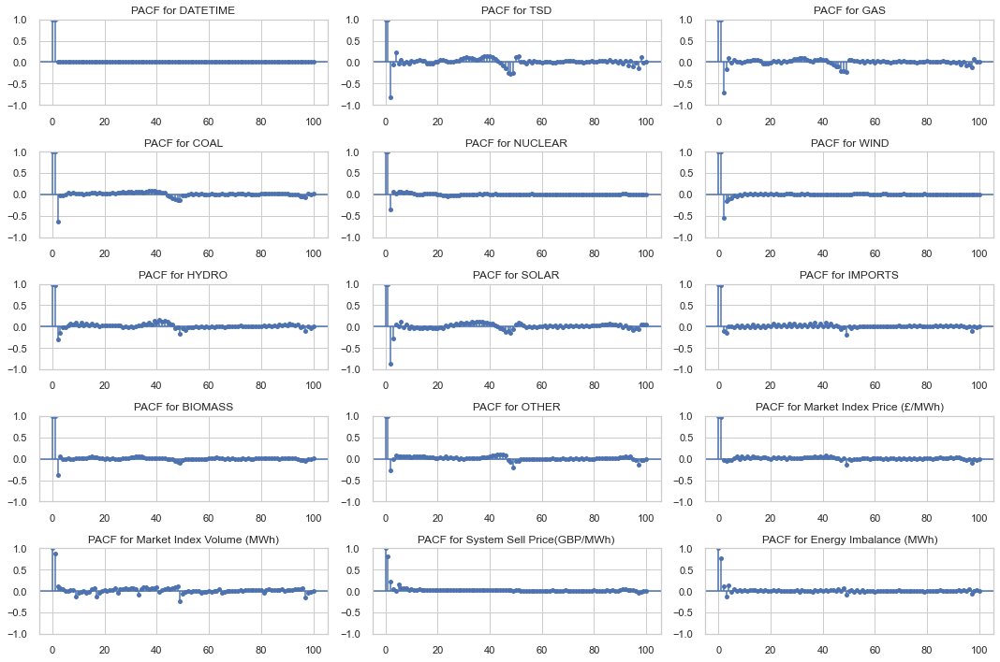

In [320]:
plot_pacf_for_columns(df_final,sc2,100)

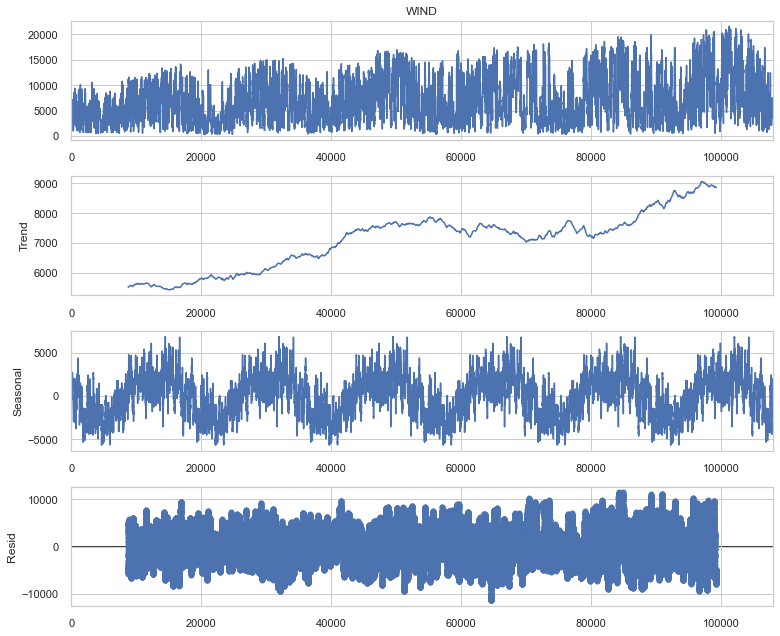

In [417]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm



# Set the default figure size
plt.rcParams['figure.figsize'] = 11, 9

# Assuming 'freq' is the frequency of your data (e.g., 360 for annual data)
freq = 360

# Perform seasonal decomposition
decomposed_data = sm.tsa.seasonal_decompose(df["WIND"],period = 17520)

# Plot the decomposition
figure = decomposed_data.plot()
plt.show()Corre

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Assuming 'df' is your DataFrame containing renewable source data (e.g., solar and wind)
# Perform STL decomposition for each renewable source and plot the residuals
for column in df_final.columns:
    stl = STL(df_final[column], period =17520 )
    result = stl.fit()
    residuals = result.resid
    plt.figure()
    plt.plot(residuals)
    plt.title(f'Residuals for {column}')
    plt.show()

In [342]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller



# Function to perform ADF test for each column and print the results
def perform_adf_test(column_data):
    result = adfuller(column_data)
    print(f'Column: {column_data.name}')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'{key}: {value}')
    print('------------------------------------')

# Loop through each column in the data frame and perform the ADF test
for column in df_final.columns:
    perform_adf_test(df_final[column])

Column: DATETIME
ADF Statistic: 124.36681681907692
p-value: 1.0
Critical Values:
1%: -3.430410511851997
5%: -2.8615667453125515
10%: -2.566784235590157
------------------------------------
Column: TSD
ADF Statistic: -14.936679818827056
p-value: 1.3413562569854054e-27
Critical Values:
1%: -3.430410550513266
5%: -2.8615667624000665
10%: -2.566784244685271
------------------------------------
Column: GAS
ADF Statistic: -21.77668903315088
p-value: 0.0
Critical Values:
1%: -3.430410550513266
5%: -2.8615667624000665
10%: -2.566784244685271
------------------------------------
Column: COAL
ADF Statistic: -10.775860560922334
p-value: 2.320819385741322e-19
Critical Values:
1%: -3.430410549952605
5%: -2.861566762152265
10%: -2.5667842445533746
------------------------------------
Column: NUCLEAR
ADF Statistic: -4.7110544745152385
p-value: 8.021971030332236e-05
Critical Values:
1%: -3.430410548270684
5%: -2.8615667614088895
10%: -2.5667842441577005
------------------------------------
Column: WIN

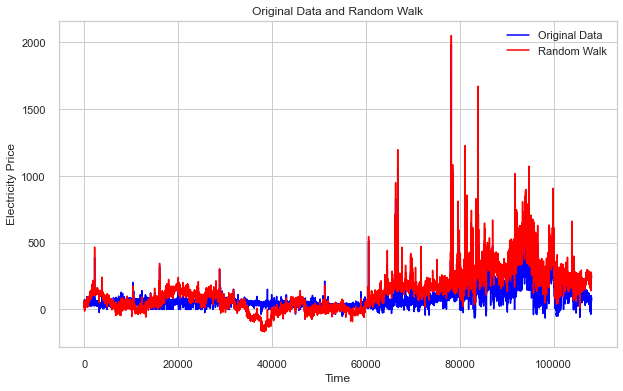

In [344]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Set the seed for reproducibility
np.random.seed(42)

# Assuming 'df' is your DataFrame and 'Electricity_Price' is the column with the electricity prices
time_series_data = df_final['Market Index Price (£/MWh)']

# Define the number of data points in the random walk
num_points = len(time_series_data)

# Generate random steps for the random walk
steps = np.random.normal(loc=0, scale=1, size=num_points)

# Calculate the cumulative sum to get the random walk
random_walk = np.cumsum(steps)

# Add the random walk values to the original time series data
random_walk_data = time_series_data + random_walk

# Create a new DataFrame to store the random walk data with the same time index as the original data
df_random_walk = pd.DataFrame({'Random Walk': random_walk_data}, index=df.index)

# Plot the original time series data and the random walk
plt.figure(figsize=(10, 6))
plt.plot(df.index, df_final['Market Index Price (£/MWh)'], label='Original Data', color='blue')
plt.plot(df_random_walk.index, df_random_walk['Random Walk'], label='Random Walk', color='red')
plt.xlabel('Time')
plt.ylabel('Electricity Price')
plt.title('Original Data and Random Walk')
plt.legend()
plt.grid(True)
plt.show()


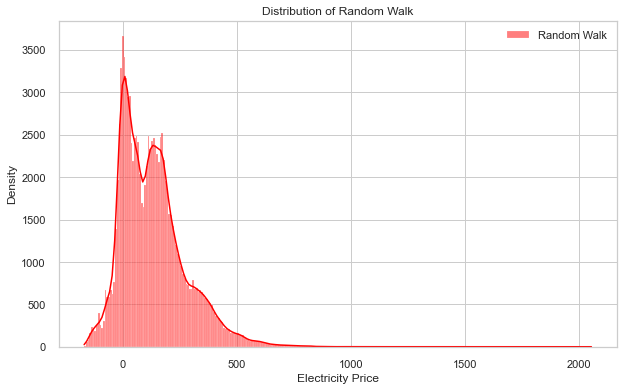

In [349]:
plt.figure(figsize=(10, 6))
sns.histplot(df_random_walk['Random Walk'], kde=True,color='red', label='Random Walk')
plt.xlabel('Electricity Price')
plt.ylabel('Density')
plt.title('Distribution of Random Walk')
plt.legend()
plt.grid(True)
plt.show()

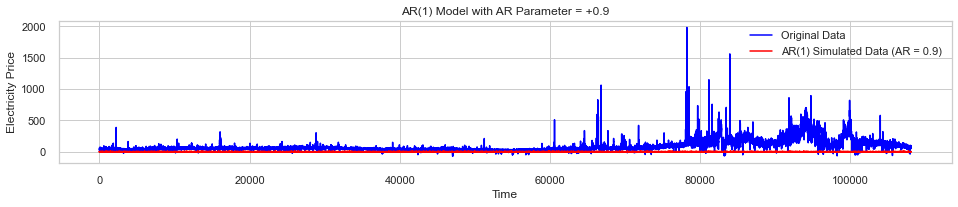

In [357]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima.model import ARIMA

# Set the seed for reproducibility
np.random.seed(42)

# Assuming 'df' is your DataFrame and 'Electricity_Price' is the column with the electricity prices
time_series_data = df_final['Market Index Price (£/MWh)']

# Define the AR parameter
ar_param = 0.9

# Create the AR(1) model with the specified AR parameter
ar1 = np.array([1, -ar_param])
ma1 = np.array([1])
AR1 = ArmaProcess(ar1, ma1)

# Generate the AR(1) time series data using the ARMA process
sim1 = AR1.generate_sample(nsample=len(time_series_data))

# Combine the simulated data with the original data in a new DataFrame
df_simulated = pd.DataFrame({'Simulated Data': sim1}, index=df_final.index)

# Plot the original data and the AR(1) simulated data
plt.figure(figsize=(16, 12))
plt.subplot(4, 1, 1)
plt.plot(df_final.index, time_series_data, label='Original Data', color='blue')
plt.plot(df_simulated.index, df_simulated['Simulated Data'], label=f'AR(1) Simulated Data (AR = {ar_param})', color='red')
plt.xlabel('Time')
plt.ylabel('Electricity Price')
plt.title('AR(1) Model with AR Parameter = +0.9')
plt.legend()
plt.grid(True)
plt.show()


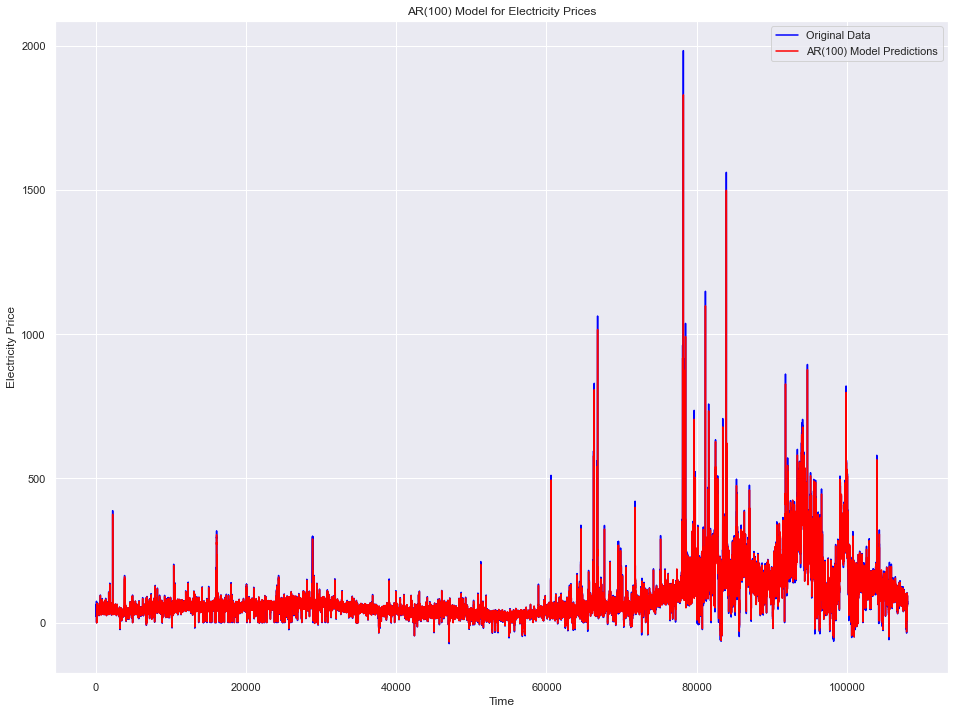

In [43]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg

# Set the seed for reproducibility
np.random.seed(42)

# Assuming 'df' is your DataFrame and 'Electricity_Price' is the column with the electricity prices
time_series_data = df_final['Market Index Price (£/MWh)']

# Define the order of the AR model (e.g., AR(1) or AR(2))
order_ar = 100

# Fit the AR model to the data
model = AutoReg(time_series_data, lags=order_ar)
results = model.fit()

# Generate the AR model's predictions
predictions = results.predict(start=order_ar, end=len(time_series_data) - 1)

# Create a new DataFrame to store the original data and the AR model's predictions
df_predictions = pd.DataFrame({'Original Data': time_series_data, 'AR Model Predictions': predictions}, index=df_final.index)

# Plot the original data and the AR model's predictions
plt.figure(figsize=(16, 12))
plt.plot(df_final.index, df_final['Market Index Price (£/MWh)'], label='Original Data', color='blue')
plt.plot(df_predictions.index, df_predictions['AR Model Predictions'], label=f'AR({order_ar}) Model Predictions', color='red')
plt.xlabel('Time')
plt.ylabel('Electricity Price')
plt.title(f'AR({order_ar}) Model for Electricity Prices')
plt.legend()
plt.grid(True)
plt.show()


In [44]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error, mean_absolute_error


predictions = results.predict(start=order_ar, end=len(time_series_data) - 1)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(time_series_data[order_ar:], predictions)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(time_series_data[order_ar:], predictions)

print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')

Mean Squared Error (MSE): 193.88
Root Mean Squared Error (RMSE): 13.92
Mean Absolute Error (MAE): 5.96


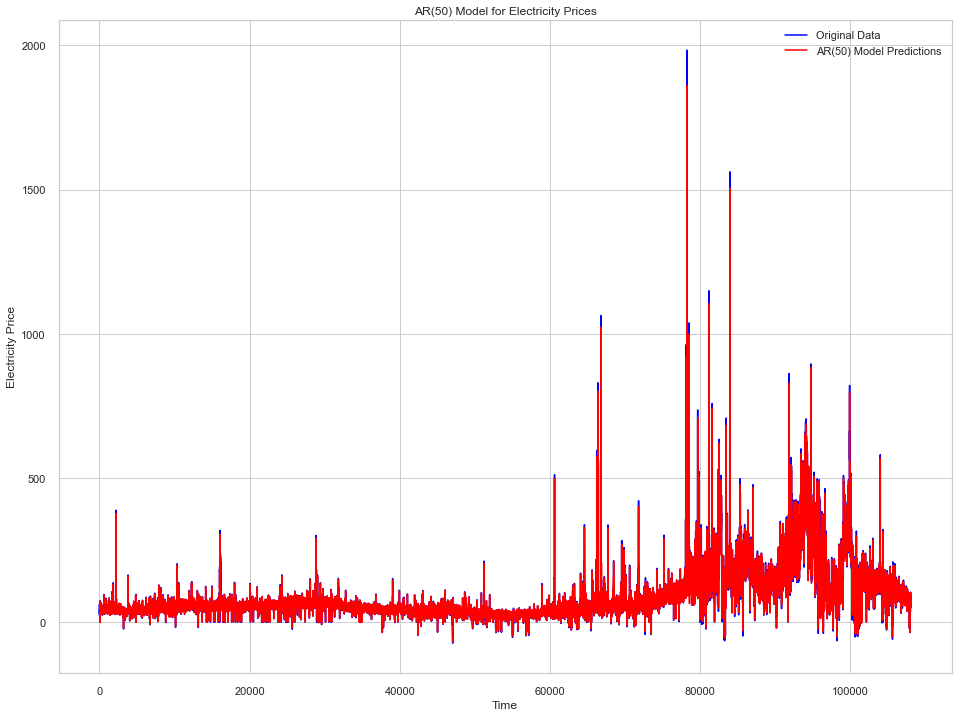

In [377]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg

# Set the seed for reproducibility
np.random.seed(42)

# Assuming 'df' is your DataFrame and 'Electricity_Price' is the column with the electricity prices
time_series_data = df_final['Market Index Price (£/MWh)']

# Define the order of the AR model (e.g., AR(1) or AR(2))
order_ar = 50

# Fit the AR model to the data
model = AutoReg(time_series_data, lags=order_ar)
results = model.fit()

# Generate the AR model's predictions
predictions = results.predict(start=order_ar, end=len(time_series_data) - 1)

# Create a new DataFrame to store the original data and the AR model's predictions
df_predictions = pd.DataFrame({'Original Data': time_series_data, 'AR Model Predictions': predictions}, index=df_final.index)

# Plot the original data and the AR model's predictions
plt.figure(figsize=(16, 12))
plt.plot(df_final.index, df_final['Market Index Price (£/MWh)'], label='Original Data', color='blue')
plt.plot(df_predictions.index, df_predictions['AR Model Predictions'], label=f'AR({order_ar}) Model Predictions', color='red')
plt.xlabel('Time')
plt.ylabel('Electricity Price')
plt.title(f'AR({order_ar}) Model for Electricity Prices')
plt.legend()
plt.grid(True)
plt.show()


In [376]:
import numpy as np
import pandas as pd
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error

def compare_ar_parameters(data, lag_orders):
    """
    Compare AR models with different lag orders and return their MSE scores.

    Parameters:
    data (pandas.Series): The time series data to fit the AR models.
    lag_orders (list): List of lag orders to compare.

    Returns:
    dict: A dictionary with lag orders as keys and their corresponding MSE scores.
    """

    mse_scores = {}
    
    for lag_order in lag_orders:
        model = AutoReg(data, lags=lag_order)
        results = model.fit()
        predictions = results.predict(start=lag_order, end=len(data) - 1)
        mse_score = mean_squared_error(data[lag_order:], predictions)
        mse_scores[lag_order] = mse_score

    return mse_scores

# Example usage:
# Assuming 'df' is your DataFrame and 'Electricity_Price' is the column with the electricity prices
time_series_data = df_final['Market Index Price (£/MWh)']

# Define a list of lag orders to compare (e.g., AR(1), AR(2), AR(3))
lag_orders_to_compare = [1, 2, 3]

# Call the function to compare the AR models
mse_scores_dict = compare_ar_parameters(time_series_data, lag_orders_to_compare)

# Print the MSE scores for each lag order
for lag_order, mse_score in mse_scores_dict.items():
    print(f"Lag Order {lag_order}: MSE = {mse_score}")


Lag Order 1: MSE = 214.97628105133163
Lag Order 2: MSE = 214.9007234155475
Lag Order 3: MSE = 214.1887563344958


In [184]:
import numpy as np
import pandas as pd
import statsmodels.api as sm

# Assuming 'data' is your time series data (pandas Series or DataFrame) named 'sim1'
# Load your dataset or time series data here

# Create the ARMA (ARIMA with d=0) model with order (1, 0, 0)
model = sm.tsa.ARIMA(df_final, order=(1, 0, 0))

# Fit the model to the data
result = model.fit()

# Print the summary of the model results
print(result.summary())

# Access and print the estimated parameters (μ and ϕ)
mu = result.params[0]
phi = result.params[1]
print("μ = {}, ϕ = {}".format(mu, phi))


ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

In [159]:
df.columns

Index(['Unnamed: 0', 'DATETIME', 'ND', 'TSD', 'ENGLAND_WALES_DEMAND',
       'EMBEDDED_WIND_GENERATION', 'EMBEDDED_WIND_CAPACITY',
       'EMBEDDED_SOLAR_GENERATION', 'EMBEDDED_SOLAR_CAPACITY',
       'PUMP_STORAGE_PUMPING', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO',
       'IMPORTS', 'BIOMASS', 'OTHER', 'SOLAR', 'STORAGE', 'GENERATION',
       'RENEWABLE', 'FOSSIL', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [158]:
df_final.columns

Index(['DATETIME', 'TSD', 'GAS', 'COAL', 'NUCLEAR', 'WIND', 'HYDRO', 'SOLAR',
       'IMPORTS', 'BIOMASS', 'OTHER', 'Market Index Price (£/MWh)',
       'Market Index Volume (MWh)', 'System Sell Price(GBP/MWh)',
       'Energy Imbalance (MWh)'],
      dtype='object')

In [398]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import math
from sklearn.metrics import mean_squared_error


# Create a DataFrame with the closing price differences
train_sample = df_1

# Create the VARMAX model with a lag order (p=2) and differencing order (d=1) and include a constant term (trend='c')
model = sm.tsa.VARMAX(train_sample, order=(2, 1), trend='c')

# Fit the model to the data
result = model.fit(maxiter=1000, disp=False)

# Print the summary of the VARMAX model results
print(result.summary())

# Predict the differences in closing prices for the next 1000 time points
predicted_result = result.predict(start=0, end=1000)

# Calculate the root mean squared error (RMSE)
rmse = math.sqrt(mean_squared_error(train_sample.iloc[1:1002].values, predicted_result.values))
print("The root mean squared error is {}.".format(rmse))

# Plot the model diagnostics
result.plot_diagnostics()


/Users/charanteja/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/varmax.py:161: EstimationWarning:

Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.


KeyboardInterrupt



In [399]:
df_final.to_csv('df_final')

In [186]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima_model import ARMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Plot ACF and PACF to determine model order (p, q)
#plot_acf(df['Data'])
#plot_pacf(df['Data'])
#plt.show()

# Fit an ARMA model
p, q = 1, 1  # You can change these values based on ACF and PACF analysis
model = ARMA(df['WIND'], order=(p, q))
results = model.fit()




NotImplementedError: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been removed in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and statsmodels.tsa.SARIMAX.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained. It also offers alternative specialized
parameter estimators.


In [ ]:
# Make forecasts
num_forecasts = 10
forecast, stderr, conf_int = results.forecast(steps=num_forecasts)

# Plot the original data and the forecast
plt.figure(figsize=(10, 6))
plt.plot(df['Data'], label='Original Data')
plt.plot(range(len(df), len(df) + num_forecasts), forecast, label='Forecast', color='red')
plt.fill_between(range(len(df), len(df) + num_forecasts), forecast - stderr, forecast + stderr, color='pink')
plt.title('ARMA Forecast')
plt.xlabel('Time')
plt.ylabel('Data')
plt.legend()
plt.show()

In [ ]:
# Fit an ARIMA model with exogenous variable
p, d, q = 1, 1, 1  # You can change these values based on ACF and PACF analysis
exog_var = df['NUMERIC_TIME']  # Use the numeric time representation as the exogenous variable
model = ARIMA(df['RENEWABLE'], order=(p, d, q), exog=exog_var)
results = model.fit()

# Make forecasts
num_forecasts = 10 * 24 * 365 * 6  # 10 samples per day, 365 days per year, 6 years
exog_forecast = exog_var.iloc[-num_forecasts:]  # Use the appropriate part of the exogenous variable
forecast, stderr, conf_int = results.get_forecast(steps=num_forecasts, exog=exog_forecast).predicted_mean, results.get_forecast(steps=num_forecasts, exog=exog_forecast).se_mean, results.get_forecast(steps=num_forecasts, exog=exog_forecast).conf_int()


/Users/charanteja/opt/anaconda3/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


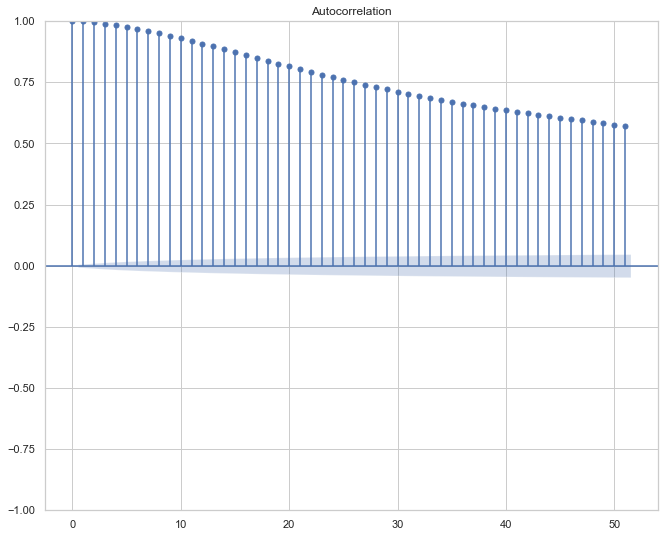

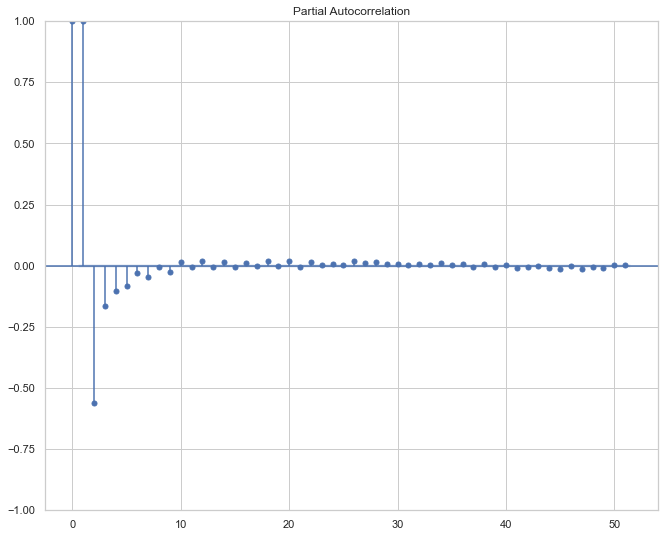

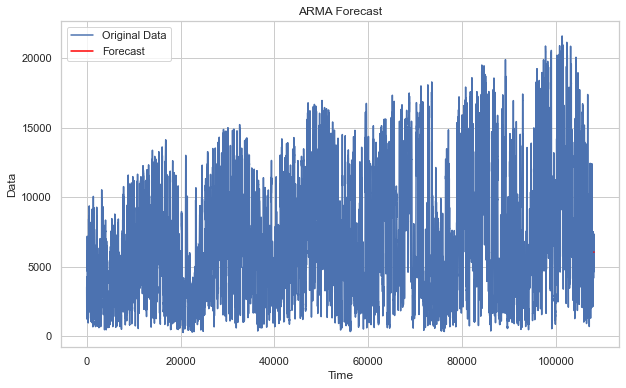

In [196]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Create a sample time series dataset
df = df_final

# Plot ACF and PACF to determine model order (p, q)
plot_acf(df['WIND'])
plot_pacf(df['WIND'])
plt.show()

# Fit an ARMA model
p, q = 1, 1  # You can change these values based on ACF and PACF analysis
d = 0  # Integration order (0 for ARMA model)
model = ARIMA(df['WIND'], order=(p, d, q))
results = model.fit()

# Make forecasts
num_forecasts = 10
forecast = results.forecast(steps=num_forecasts)

residuals = results.resid

# Plot the original data and the forecast
plt.figure(figsize=(10, 6))
plt.plot(df['WIND'], label='Original Data')
plt.plot(range(len(df), len(df) + num_forecasts), forecast, label='Forecast', color='red')
plt.title('ARMA Forecast')
plt.xlabel('Time')
plt.ylabel('Data')
plt.legend()
plt.show()



In [226]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox
from scipy.stats import normaltest

df = df_final

# Fit an ARMA model
p, q = 1, 1  # You can change these values based on ACF and PACF analysis
d = 0  # Integration order (0 for ARMA model)
model = ARIMA(df['Market Index Price (£/MWh)'], order=(p, d, q))
results = model.fit()

# Make forecasts
num_forecasts = 10000
forecast = results.forecast(steps=num_forecasts)

residuals = results.resid



Ljung-Box Test (p-values): 1       7.466685e-01
2       8.346067e-76
3       1.449004e-86
4      3.422187e-104
5      2.585304e-107
           ...      
96      0.000000e+00
97      0.000000e+00
98      0.000000e+00
99      0.000000e+00
100     0.000000e+00
Name: lb_pvalue, Length: 100, dtype: float64
------------------------------
Normality Test (p-value): 0.0
------------------------------


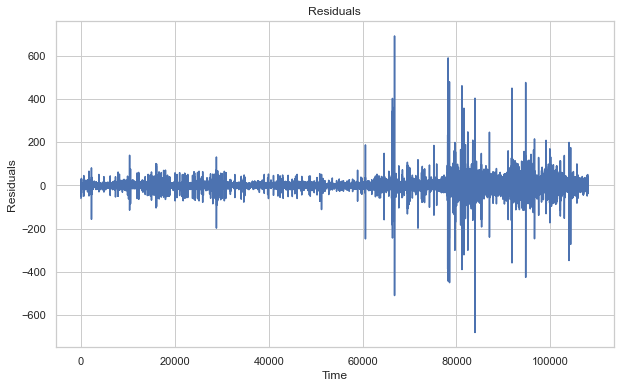

------------------------------
AIC: 887058.3715136052
BIC: 887096.7336513824


In [233]:
lb_test = acorr_ljungbox(residuals, lags=100)
p_values = lb_test['lb_pvalue']
print("Ljung-Box Test (p-values):", p_values)

print("------------------------------")

normality_test = normaltest(residuals)
print("Normality Test (p-value):", normality_test.pvalue)


print("------------------------------")

# Plot the residuals
plt.figure(figsize=(10, 6))
plt.plot(residuals)
plt.title('Residuals')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.show()


print("------------------------------")

# Calculate AIC and BIC
aic = results.aic
bic = results.bic
print("AIC:", aic)
print("BIC:", bic)

In [ ]:

# Perform Ljung-Box test for autocorrelation
lb_test = acorr_ljungbox(residuals, lags=10)
print("Ljung-Box Test (p-values):", lb_test[1])

# Check for normality of residuals





